# INSTALL DEPENDENCIES

In [ ]:
!pip install shap

In [ ]:
pip install lime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 3.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=e400fd58e7c9451fbdb34696ecb19b445a60c810218ec07cf812c852074a0207
  Stored in directory: /root/.cache/pip/wheels/fd/a2/af/9ac0a1a85a27f314a06b39e1f492bee1547d52549a4606ed89
Successfully built lime


In [ ]:
pip install catboost

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.7/98.7 MB 5.6 MB/s eta 0:00:00


# DATA PREPARATION AND CLEANING

In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
import plotly.offline as py
np.random.seed(42)

In [ ]:
# Read the PIMA Dataset
df = pd.read_csv('/content/drive/MyDrive/TESI/diabetes.csv')
df.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 768 entries, 0 to 767
Data columns (total 9 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Pregnancies               768 non-null    int64  
 1   Glucose                   768 non-null    int64  
 2   BloodPressure             768 non-null    int64  
 3   SkinThickness             768 non-null    int64  
 4   Insulin                   768 non-null    int64  
 5   BMI                       768 non-null    float64
 6   DiabetesPedigreeFunction  768 non-null    float64
 7   Age                       768 non-null    int64  
 8   Outcome                   768 non-null    int64  
dtypes: float64(2), int64(7)
memory usage: 54.1 KB


Possiamo notare la presenza di valori a 0 in Glucosio, Blood Pressure ecc, probabilmente i valori mancanti sono stati gestiti riempiendoli con zeri

In [ ]:
df.describe(include='all')

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
count,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000
mean,3.845052,120.894531,69.105469,20.536458,79.799479,31.992578,0.471876,33.240885,0.348958
std,3.369578,31.972618,19.355807,15.952218,115.244002,7.884160,0.331329,11.760232,0.476951
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.078000,21.000000,0.000000
25%,1.000000,99.000000,62.000000,0.000000,0.000000,27.300000,0.243750,24.000000,0.000000
50%,3.000000,117.000000,72.000000,23.000000,30.500000,32.000000,0.372500,29.000000,0.000000
75%,6.000000,140.250000,80.000000,32.000000,127.250000,36.600000,0.626250,41.000000,1.000000
max,17.000000,199.000000,122.000000,99.000000,846.000000,67.100000,2.420000,81.000000,1.000000


Controlliamo quanti valori mancanti abbiamo

In [ ]:
error = ['Glucose', 'BloodPressure', 'SkinThickness', 'Insulin','BMI', 'DiabetesPedigreeFunction']
df[error].isin([0]).sum()

,0
Glucose,5
BloodPressure,35
SkinThickness,227
Insulin,374
BMI,11
DiabetesPedigreeFunction,0


Riempiamo i valori mancanti con la mediana essendo questa meno sensibile ad outliers

In [ ]:
import pandas as pd

# Supponiamo che il tuo DataFrame si chiami 'data'
# Lista delle colonne da controllare
error_columns = ['Glucose', 'BloodPressure', 'SkinThickness', 'Insulin', 'BMI', 'DiabetesPedigreeFunction']

# Calcola la mediana per ciascuna colonna, escludendo i valori zero
mediane = {}
for col in error_columns:
    # Filtra i valori diversi da zero
    non_zero_values = df[df[col] != 0][col]
    # Calcola la mediana
    mediane[col] = non_zero_values.median()

# Sostituisci i valori zero con la mediana calcolata per ciascuna colonna
for col in error_columns:
    df[col].replace(0, mediane[col], inplace=True)

df.to_csv('diabetes_clean.csv', index=False)


<ipython-input-31-92c8d31ecd95>:17: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.





In [ ]:
error = ['Glucose', 'BloodPressure', 'SkinThickness', 'Insulin','BMI', 'DiabetesPedigreeFunction']
df[error].isin([0]).sum()

,0
Glucose,0
BloodPressure,0
SkinThickness,0
Insulin,0
BMI,0
DiabetesPedigreeFunction,0


In [ ]:
df.describe()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
count,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000
mean,3.845052,121.656250,72.386719,29.108073,140.671875,32.455208,0.471876,33.240885,0.348958
std,3.369578,30.438286,12.096642,8.791221,86.383060,6.875177,0.331329,11.760232,0.476951
min,0.000000,44.000000,24.000000,7.000000,14.000000,18.200000,0.078000,21.000000,0.000000
25%,1.000000,99.750000,64.000000,25.000000,121.500000,27.500000,0.243750,24.000000,0.000000
50%,3.000000,117.000000,72.000000,29.000000,125.000000,32.300000,0.372500,29.000000,0.000000
75%,6.000000,140.250000,80.000000,32.000000,127.250000,36.600000,0.626250,41.000000,1.000000
max,17.000000,199.000000,122.000000,99.000000,846.000000,67.100000,2.420000,81.000000,1.000000


,count
Outcome,
0,500
1,268


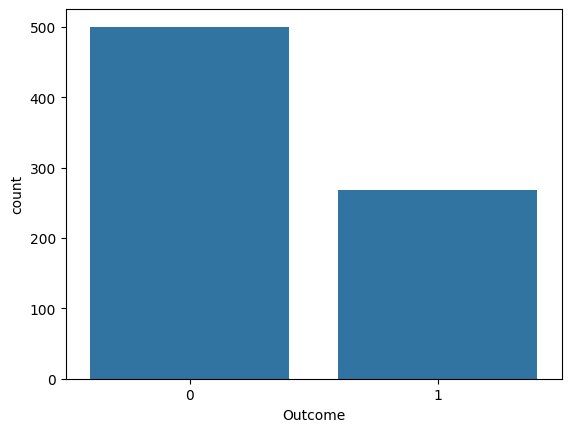

In [ ]:
sns.countplot(x = df['Outcome'])
df['Outcome'].value_counts()

Identifichiamo l'eventuale presenza di outliers e sostituiamoli con la mediana per evitare di cancellare righe potenzialmente significative

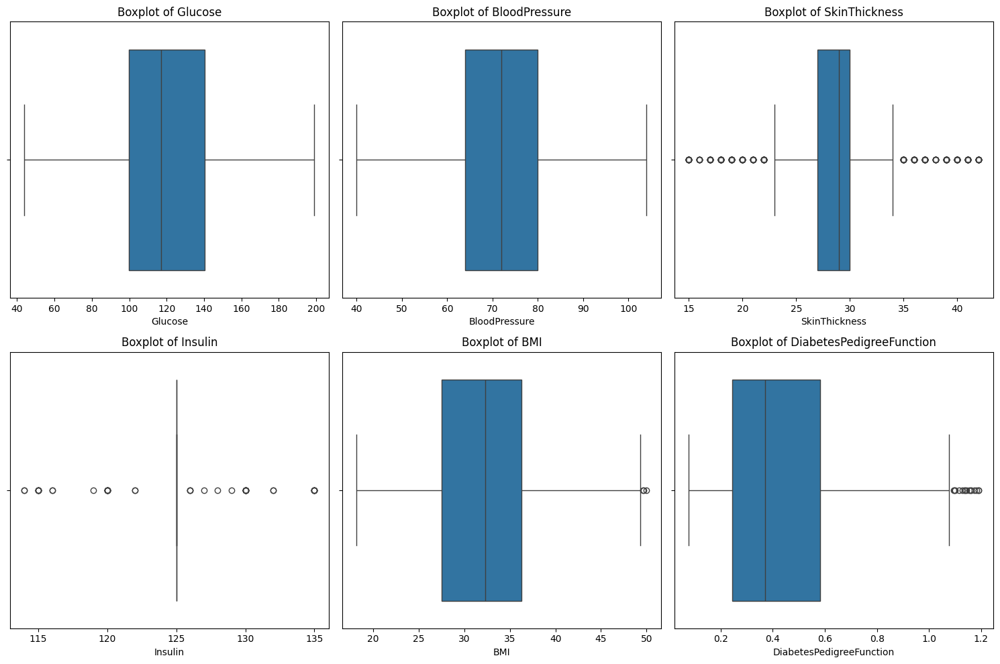

In [ ]:
columns_to_check = ['Glucose', 'BloodPressure', 'SkinThickness', 'Insulin', 'BMI', 'DiabetesPedigreeFunction']

# Funzione per calcolare la mediana
def get_median(df, col):
    return df[col].median()

# Funzione per rilevare e gestire gli outlier
def handle_outliers_with_median(df, columns):
    for col in columns:
        # Calcola il primo e terzo quartile e l'IQR
        Q1 = df[col].quantile(0.25)
        Q3 = df[col].quantile(0.75)
        IQR = Q3 - Q1

        # Calcola i limiti inferiori e superiori
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR

        # Calcola la mediana della colonna
        median_value = get_median(df, col)

        # Sostituisci gli outlier con la mediana
        df[col] = np.where((df[col] < lower_bound) | (df[col] > upper_bound), median_value, df[col])

    return df

# Gestisci gli outlier sostituendoli con la mediana
df = handle_outliers_with_median(df, columns_to_check)

# Salva i dati modificati
df.to_csv('diabetes_clean_no_outliers_median.csv', index=False)

# Visualizza boxplot per confermare la gestione degli outlier
plt.figure(figsize=(15, 10))
for i, col in enumerate(columns_to_check, 1):
    plt.subplot(2, 3, i)
    sns.boxplot(x=df[col])
    plt.title(f'Boxplot of {col}')

plt.tight_layout()
plt.show()

Avendo un dataset sbilanciato verso la classe 0 (non diabetici) la tecnica di upsampling ci permette di bilanciare il dataset replicando i campioni della classe meno rappresentata

In [ ]:
# We will be using upsampling technique
from sklearn.utils import resample
data_major = df[(df['Outcome']==0)]
data_minor = df[(df['Outcome']==1)]
upsample = resample(data_minor,
                    replace = True,
                    n_samples = 500,
                    random_state= 42)
df = pd.concat([upsample, data_major])

,count
Outcome,
1,500
0,500


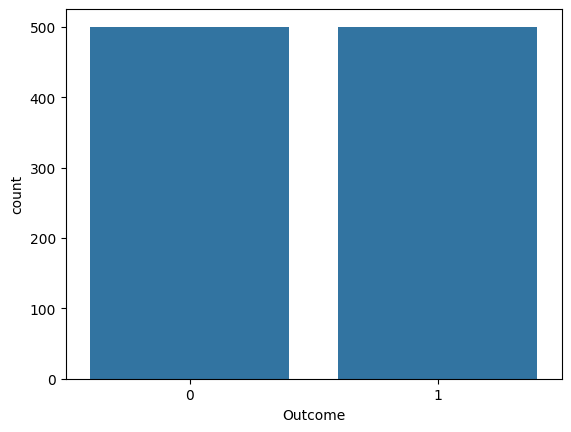

In [ ]:
sns.countplot(x = df['Outcome'])
df['Outcome'].value_counts()

Possiamo notare come Glucosio sia fortemente correlato all'outcome mentre Insulina sia poco rilevante.

<Axes: >

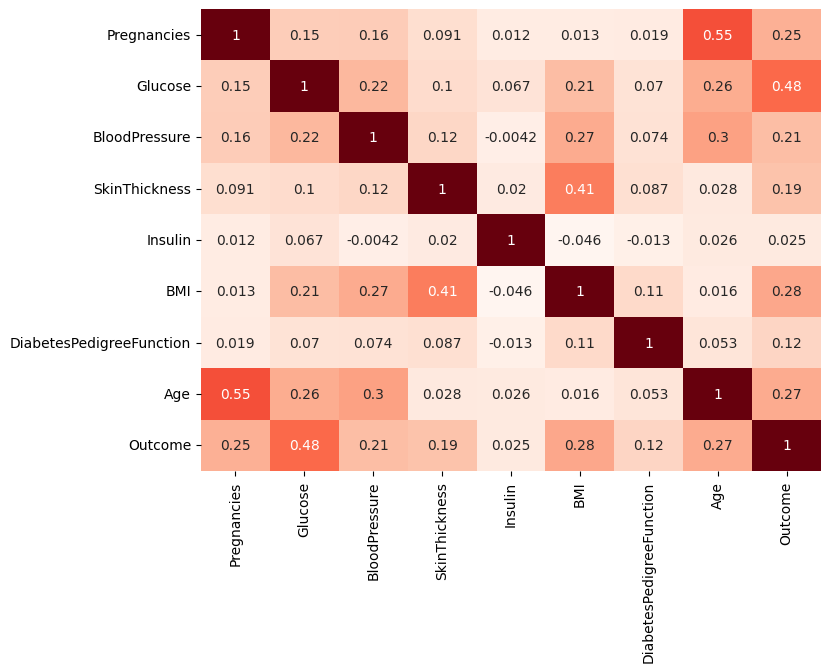

In [ ]:
plt.figure(figsize = (8,6))
corr = df.corr()
sns.heatmap(corr,annot = True,cbar = False, cmap = 'Reds')

In [ ]:
X = df.drop('Outcome',axis = 1)
y = df['Outcome']
X= pd.get_dummies(X)
X.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1000 entries, 269 to 767
Data columns (total 8 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Pregnancies               1000 non-null   int64  
 1   Glucose                   1000 non-null   float64
 2   BloodPressure             1000 non-null   float64
 3   SkinThickness             1000 non-null   float64
 4   Insulin                   1000 non-null   float64
 5   BMI                       1000 non-null   float64
 6   DiabetesPedigreeFunction  1000 non-null   float64
 7   Age                       1000 non-null   int64  
dtypes: float64(6), int64(2)
memory usage: 70.3 KB


Splittiamo il dataset

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split

# Step 1: Split the data into training+validation and test sets
X_train_val, X_test, y_train_val, y_test = train_test_split(
    X, y, test_size=0.30, random_state=42  # 30% for test set
)

# Step 2: Split the training+validation set into training and validation sets
X_train, X_val, y_train, y_val = train_test_split(
    X_train_val, y_train_val, test_size=0.10 / 0.70, random_state=42  # 10% of 70% for validation set
)

# Optional: Print out the shapes to verify the splits
print(f"Training set shape: {X_train.shape}")
print(f"Validation set shape: {X_val.shape}")
print(f"Test set shape: {X_test.shape}")


Training set shape: (599, 8)
Validation set shape: (101, 8)
Test set shape: (300, 8)


In [ ]:
y_test.head()

,Outcome
44,0
382,0
385,0
258,0
19,1


In [ ]:
X_test.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age
44,7,159.0,64.0,29.0,125.0,27.4,0.294,40
382,1,109.0,60.0,29.0,125.0,25.4,0.947,21
385,1,119.0,54.0,29.0,125.0,22.3,0.205,24
258,1,193.0,50.0,16.0,125.0,25.9,0.655,24
19,1,115.0,70.0,30.0,125.0,34.6,0.529,32


In [ ]:
X_test.to_csv('/content/drive/MyDrive/TESI/X_test.csv', index=False)
print("File X_test.csv salvato correttamente.")

File X_test.csv salvato correttamente.


In [ ]:
#Preserve the columns of test and train set
train_set_columns = X_train.columns
test_set_columns = X_test.columns

In [ ]:
print(train_set_columns)
print(test_set_columns)

Index(['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin',
       'BMI', 'DiabetesPedigreeFunction', 'Age'],
      dtype='object')
Index(['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin',
       'BMI', 'DiabetesPedigreeFunction', 'Age'],
      dtype='object')


# DECISION TREE

- criterion='entropy': La funzione di misura utilizzata per decidere come suddividere i nodi dell'albero. entropy indica che viene usata l'entropia (o la funzione di entropia informativa) per valutare la purezza delle suddivisioni.

- splitter='best': Questo parametro indica la strategia per scegliere la suddivisione nei nodi. Con best, l'albero selezionerà la migliore suddivisione tra tutte le possibili. Un'alternativa è random, che scegli a caso tra le possibili suddivisioni migliori.

- max_depth=10: Limita la profondità massima dell'albero a 10 livelli. Limitare la profondità serve a evitare l'overfitting, perché altrimenti l'albero potrebbe diventare troppo complesso e adattarsi troppo ai dati di addestramento.

- min_samples_split=60: Specifica il numero minimo di campioni richiesti per poter dividere un nodo. Qui il valore è 60, quindi un nodo verrà suddiviso solo se contiene almeno 60 campioni.

- min_samples_leaf=30: Stabilisce che un nodo foglia (ovvero un nodo terminale) deve avere almeno 30 campioni. Questo serve a prevenire la creazione di foglie con pochi campioni, che potrebbero rappresentare rumore o essere troppo specifiche ai dati di addestramento.

In [ ]:
#define a decision tree and fit it
from sklearn import tree
dt = tree.DecisionTreeClassifier(criterion='entropy', splitter='best',
                                  max_depth=10,
                                  min_samples_split=60, min_samples_leaf=30)
dt = dt.fit(X_train, y_train)

In [ ]:
#predict using the decision tree
#the predict function returns the actual predicted labels: we need them for the evaluation phase
train_pred_dt = dt.predict(X_train)
test_pred_dt = dt.predict(X_test)

In [ ]:
#evaulate the accuracy on the train set and the test set
#metrics also contains precision, recall, f1 and the support
from sklearn import metrics

print('Accuracy train set ', metrics.accuracy_score(y_train, train_pred_dt))
print('Accuracy test set ', metrics.accuracy_score(y_test, test_pred_dt))
print('Precision train set ', metrics.precision_score(y_train, train_pred_dt, average='weighted'))
print('Recall train set ', metrics.recall_score(y_train, train_pred_dt, average='weighted'))
print('F1 score train set ', metrics.f1_score(y_train, train_pred_dt, average='weighted'))
print('Support train set ', metrics.precision_recall_fscore_support(y_train, train_pred_dt))

Accuracy train set  0.7946577629382304
Accuracy test set  0.7666666666666667
Precision train set  0.7956550298867217
Recall train set  0.7946577629382304
F1 score train set  0.7946577629382304
Support train set  (array([0.81506849, 0.7752443 ]), array([0.7752443 , 0.81506849]), array([0.79465776, 0.79465776]), array([307, 292]))


In [ ]:
# Metriche per il set di training
print('Accuracy train set:', metrics.accuracy_score(y_train, train_pred_dt))
print('Precision train set (weighted):', metrics.precision_score(y_train, train_pred_dt, average='weighted'))
print('Recall train set (weighted):', metrics.recall_score(y_train, train_pred_dt, average='weighted'))
print('F1 score train set (weighted):', metrics.f1_score(y_train, train_pred_dt, average='weighted'))

# Metriche per il set di test
print('Accuracy test set:', metrics.accuracy_score(y_test, test_pred_dt))
print('Precision test set (weighted):', metrics.precision_score(y_test, test_pred_dt, average='weighted'))
print('Recall test set (weighted):', metrics.recall_score(y_test, test_pred_dt, average='weighted'))
print('F1 score test set (weighted):', metrics.f1_score(y_test, test_pred_dt, average='weighted'))

Accuracy train set: 0.7946577629382304
Precision train set (weighted): 0.7956550298867217
Recall train set (weighted): 0.7946577629382304
F1 score train set (weighted): 0.7946577629382304
Accuracy test set: 0.7666666666666667
Precision test set (weighted): 0.7668564312399928
Recall test set (weighted): 0.7666666666666667
F1 score test set (weighted): 0.7666251778093883


In [ ]:
#metrics computed on the test set
from sklearn.metrics import classification_report
def report_scores(test_label, test_pred):
    print(classification_report(test_label,
                            test_pred,
                            target_names=['0', '1']))

In [ ]:
report_scores(y_test, test_pred_dt)


              precision    recall  f1-score   support

           0       0.76      0.78      0.77       150
           1       0.77      0.75      0.76       150

    accuracy                           0.77       300
   macro avg       0.77      0.77      0.77       300
weighted avg       0.77      0.77      0.77       300



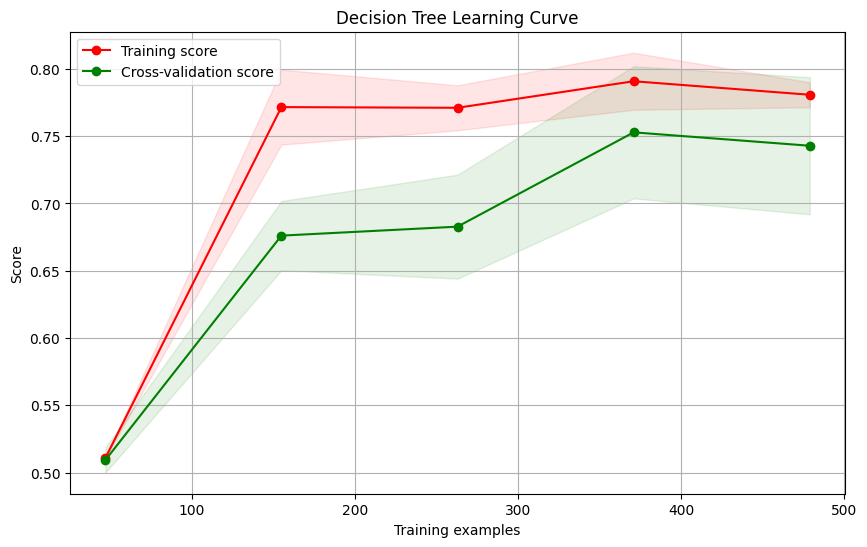

In [ ]:
from sklearn.model_selection import learning_curve
# Funzione per calcolare la curva di apprendimento
def plot_learning_curve(estimator, title, X, y, cv=None, n_jobs=1, train_sizes=np.linspace(0.1, 1.0, 5)):
    plt.figure(figsize=(10, 6))
    plt.title(title)
    plt.xlabel("Training examples")
    plt.ylabel("Score")
    train_sizes, train_scores, test_scores = learning_curve(
        estimator, X, y, cv=cv, n_jobs=n_jobs, train_sizes=train_sizes
    )
    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    test_scores_mean = np.mean(test_scores, axis=1)
    test_scores_std = np.std(test_scores, axis=1)
    plt.grid()

    plt.fill_between(train_sizes, train_scores_mean - train_scores_std, train_scores_mean + train_scores_std, alpha=0.1, color="r")
    plt.fill_between(train_sizes, test_scores_mean - test_scores_std, test_scores_mean + test_scores_std, alpha=0.1, color="g")
    plt.plot(train_sizes, train_scores_mean, 'o-', color="r", label="Training score")
    plt.plot(train_sizes, test_scores_mean, 'o-', color="g", label="Cross-validation score")

    plt.legend(loc="best")
    plt.show()

# Creazione e addestramento del modello Decision Tree
#dt = DecisionTreeClassifier(max_depth=10, criterion='entropy')
plot_learning_curve(dt, "Decision Tree Learning Curve", X_train, y_train)

CONFUSION MATRIX:

- 238 (in alto a sinistra): rappresenta il numero di veri negativi (True Negatives - TN), cioè i casi in cui il modello ha predetto 0 (nessun diabete) correttamente.

- 69 (in alto a destra): rappresenta il numero di falsi positivi (False Positives - FP), cioè i casi in cui il modello ha predetto 1 (diabete) ma il paziente non ha il diabete (errore del modello).

- 54 (in basso a sinistra): rappresenta il numero di falsi negativi (False Negatives - FN), cioè i casi in cui il modello ha predetto 0 (nessun diabete) ma il paziente ha il diabete (errore del modello).

- 238 (in basso a destra): rappresenta il numero di veri positivi (True Positives - TP), cioè i casi in cui il modello ha predetto 1 (diabete) correttamente.

Stessa cosa per il test set

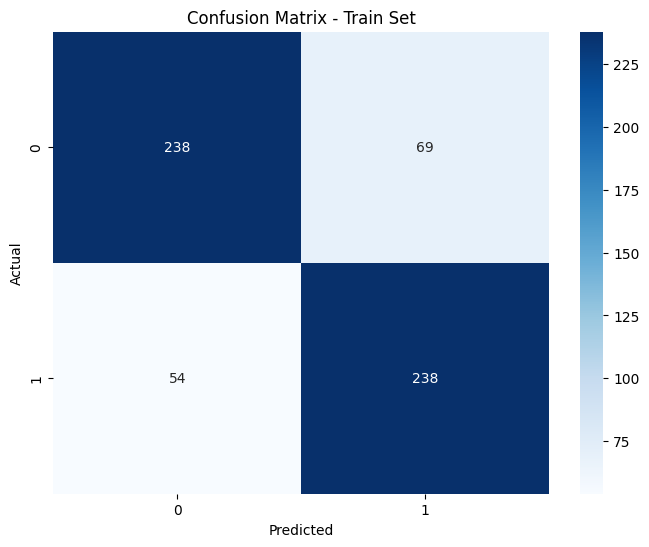

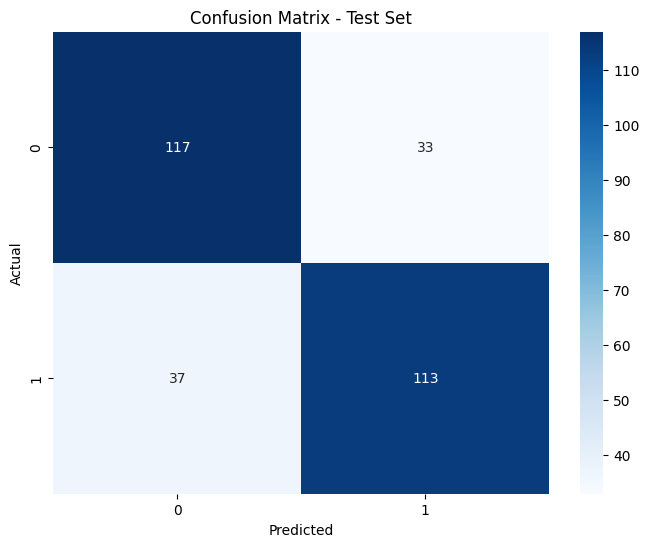

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

# Matrice di confusione per il train set
conf_matrix_train = confusion_matrix(y_train, train_pred_dt)
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix_train, annot=True, fmt="d", cmap='Blues')
plt.title('Confusion Matrix - Train Set')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

# Matrice di confusione per il test set
conf_matrix_test = confusion_matrix(y_test, test_pred_dt)
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix_test, annot=True, fmt="d", cmap='Blues')
plt.title('Confusion Matrix - Test Set')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()


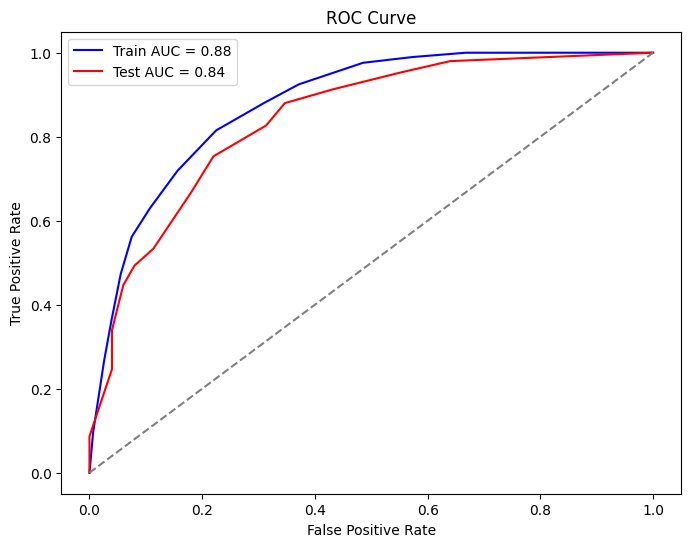

In [ ]:
from sklearn.metrics import roc_curve, auc

# Probabilità predette
y_train_pred_prob = dt.predict_proba(X_train)[:, 1]
y_test_pred_prob = dt.predict_proba(X_test)[:, 1]

# Curva ROC per il train set
fpr_train, tpr_train, _ = roc_curve(y_train, y_train_pred_prob)
roc_auc_train = auc(fpr_train, tpr_train)

fpr_test, tpr_test, _ = roc_curve(y_test, y_test_pred_prob)
roc_auc_test = auc(fpr_test, tpr_test)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr_train, tpr_train, color='blue', label=f'Train AUC = {roc_auc_train:.2f}')
plt.plot(fpr_test, tpr_test, color='red', label=f'Test AUC = {roc_auc_test:.2f}')
plt.plot([0, 1], [0, 1], color='grey', linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend()
plt.show()


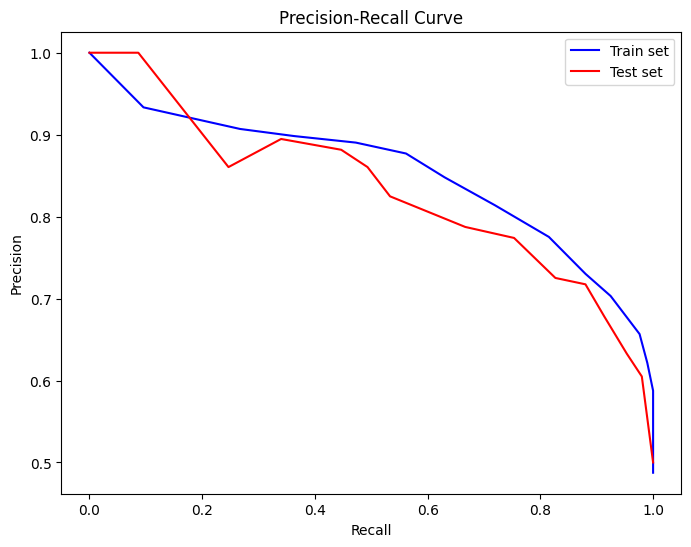

In [ ]:
from sklearn.metrics import precision_recall_curve

# Curva precision-recall per il train set
precision_train, recall_train, _ = precision_recall_curve(y_train, y_train_pred_prob)
precision_test, recall_test, _ = precision_recall_curve(y_test, y_test_pred_prob)

plt.figure(figsize=(8, 6))
plt.plot(recall_train, precision_train, color='blue', label='Train set')
plt.plot(recall_test, precision_test, color='red', label='Test set')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.legend()
plt.show()


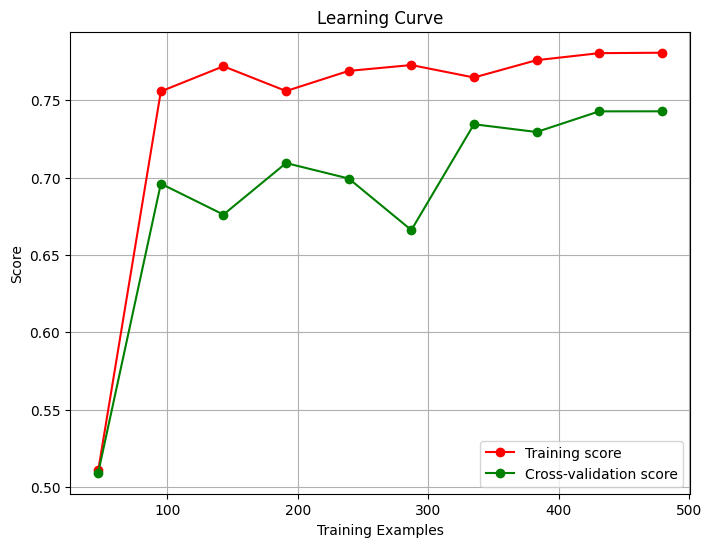

In [ ]:
from sklearn.model_selection import learning_curve

train_sizes, train_scores, test_scores = learning_curve(dt, X_train, y_train, cv=5, scoring='accuracy', n_jobs=-1, train_sizes=np.linspace(0.1, 1.0, 10))

train_scores_mean = np.mean(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)

plt.figure(figsize=(8, 6))
plt.plot(train_sizes, train_scores_mean, 'o-', color="r", label="Training score")
plt.plot(train_sizes, test_scores_mean, 'o-', color="g", label="Cross-validation score")
plt.title('Learning Curve')
plt.xlabel('Training Examples')
plt.ylabel('Score')
plt.legend(loc="best")
plt.grid()
plt.show()


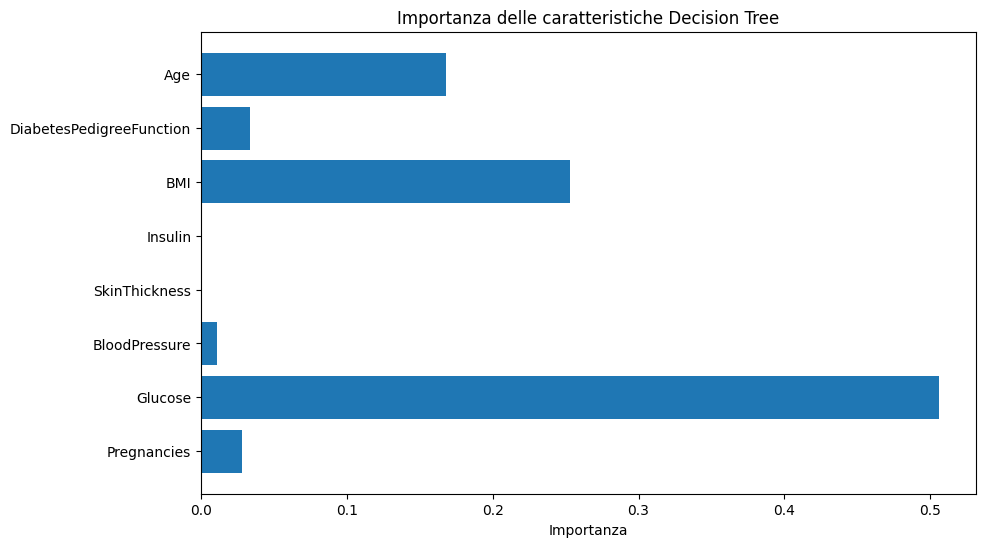

In [ ]:
importances = dt.feature_importances_
feature_names = X_train.columns

# Visualizzazione delle importanze
plt.figure(figsize=(10, 6))
plt.barh(feature_names, importances)
plt.xlabel('Importanza')
plt.title('Importanza delle caratteristiche Decision Tree')
plt.show()

# LIME DT

In [ ]:
import lime
import lime.lime_tabular
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
import warnings
warnings.filterwarnings('ignore', category=FutureWarning)
warnings.filterwarnings('ignore', category=UserWarning)

# Choose a sample from the test set for interpretation
sample_index = 0  # Replace with the index of the sample you want to interpret


# Crea un esplainer LIME
explainer = lime.lime_tabular.LimeTabularExplainer(X_train.values, feature_names=X_train.columns, class_names=['No Diabete', 'Diabete'], discretize_continuous=True)

# Spiega la previsione del modello per l'istanza selezionata
explanation = explainer.explain_instance(X_test.iloc[0], dt.predict_proba, num_features=len(train_set_columns), top_labels=0)

# Visualizza l'esposizione
explanation.show_in_notebook(show_table=True, show_all=True)

Ogni riga mostra una spiegazione locale generata da LIME per una particolare istanza. LIME genera una serie di regole (rappresentate da condizioni sui valori delle feature) che spiegano perché il modello ha fatto una determinata previsione. Le regole vengono ordinate in base alla loro importanza, con Feature_0 che rappresenta la regola più importante per quella previsione.

In [ ]:
import lime.lime_tabular
import pandas as pd

# Inizializza un esplainer LIME
explainer = lime.lime_tabular.LimeTabularExplainer(X_train.values,
                                                   feature_names=X_train.columns,
                                                   class_names=['No Diabete', 'Diabete'],
                                                   discretize_continuous=True)

# Lista per memorizzare le spiegazioni
explanations_list = []

# Itera su ogni istanza del test set
for i in range(X_test.shape[0]):
    explanation = explainer.explain_instance(X_test.iloc[i], dt.predict_proba, num_features=len(train_set_columns))

    # Estrai le spiegazioni in un formato strutturato (ad esempio, un dizionario)
    exp_dict = {f'Feature_{i}': explanation.as_list()[i][0] for i in range(len(explanation.as_list()))}
    exp_dict['Instance'] = i  # Aggiungi l'indice dell'istanza
    exp_dict['Prediction'] = dt.predict([X_test.iloc[i]])[0]  # Aggiungi la previsione del modello

    # Aggiungi le spiegazioni alla lista
    explanations_list.append(exp_dict)

# Converti le spiegazioni in un DataFrame
explanations_df = pd.DataFrame(explanations_list)

# Salva il DataFrame in un file CSV
explanations_df.to_csv('lime_explanations.csv', index=False)

print("Spiegazioni salvate in lime_explanations.csv")


Spiegazioni salvate in lime_explanations.csv


In [ ]:
import lime.lime_tabular
import pandas as pd

# Inizializza un esplainer LIME
explainer = lime.lime_tabular.LimeTabularExplainer(X_train.values,
                                                   feature_names=X_train.columns,
                                                   class_names=['No Diabete', 'Diabete'],
                                                   discretize_continuous=True)

# Lista per memorizzare le spiegazioni
explanations_list = []

# Itera su ogni istanza del test set
for i in range(X_test.shape[0]):
    explanation = explainer.explain_instance(X_test.iloc[i], dt.predict_proba, num_features=len(X_train.columns))

    # Estrai le spiegazioni in un formato strutturato (ad esempio, un dizionario)
    exp_dict = {f'Feature_{j}': explanation.as_list()[j][0] for j in range(len(explanation.as_list()))}

    # Aggiungi l'indice dell'istanza originale
    exp_dict['Original_Index'] = X_test.index[i]

    # Aggiungi l'indice locale dell'istanza nel test set
    exp_dict['Test_Instance'] = i

    # Aggiungi la previsione del modello
    exp_dict['Prediction'] = dt.predict([X_test.iloc[i]])[0]

    # Aggiungi le spiegazioni alla lista
    explanations_list.append(exp_dict)

# Converti le spiegazioni in un DataFrame
explanations_df = pd.DataFrame(explanations_list)

# Salva il DataFrame in un file CSV
explanations_df.to_csv('/content/drive/MyDrive/TESI/lime_explanations.csv', index=False)

print("Spiegazioni salvate in lime_explanations.csv")


Spiegazioni salvate in lime_explanations.csv


In [ ]:
explanations_df.head(20)

,Feature_0,Feature_1,Feature_2,Feature_3,Feature_4,Feature_5,Feature_6,Feature_7,Original_Index,Test_Instance,Prediction
0,Glucose > 145.00,BMI <= 27.95,31.00 < Age <= 43.00,Insulin <= 125.00,Pregnancies > 6.00,0.25 < DiabetesPedigreeFunction <= 0.37,28.00 < SkinThickness <= 29.00,BloodPressure <= 66.00,44,0,0
1,BMI <= 27.95,104.00 < Glucose <= 122.00,Age <= 24.00,Insulin <= 125.00,Pregnancies <= 1.00,DiabetesPedigreeFunction > 0.58,28.00 < SkinThickness <= 29.00,BloodPressure <= 66.00,382,1,0
2,BMI <= 27.95,104.00 < Glucose <= 122.00,Age <= 24.00,DiabetesPedigreeFunction <= 0.25,BloodPressure <= 66.00,Insulin <= 125.00,28.00 < SkinThickness <= 29.00,Pregnancies <= 1.00,385,2,0
3,Glucose > 145.00,BMI <= 27.95,Age <= 24.00,Insulin <= 125.00,DiabetesPedigreeFunction > 0.58,Pregnancies <= 1.00,SkinThickness <= 28.00,BloodPressure <= 66.00,258,3,0
4,104.00 < Glucose <= 122.00,32.40 < BMI <= 36.60,31.00 < Age <= 43.00,29.00 < SkinThickness <= 31.00,Insulin <= 125.00,Pregnancies <= 1.00,66.00 < BloodPressure <= 72.00,0.37 < DiabetesPedigreeFunction <= 0.58,19,4,1
5,Glucose > 145.00,BMI > 36.60,31.00 < Age <= 43.00,Insulin <= 125.00,28.00 < SkinThickness <= 29.00,3.00 < Pregnancies <= 6.00,DiabetesPedigreeFunction > 0.58,BloodPressure > 80.00,286,5,1
6,122.00 < Glucose <= 145.00,BMI > 36.60,24.00 < Age <= 31.00,Pregnancies <= 1.00,DiabetesPedigreeFunction <= 0.25,BloodPressure > 80.00,28.00 < SkinThickness <= 29.00,Insulin <= 125.00,201,6,1
7,Glucose <= 104.00,BMI <= 27.95,Age <= 24.00,0.25 < DiabetesPedigreeFunction <= 0.37,BloodPressure <= 66.00,Insulin <= 125.00,1.00 < Pregnancies <= 3.00,28.00 < SkinThickness <= 29.00,32,7,0
8,Glucose <= 104.00,BMI > 36.60,24.00 < Age <= 31.00,Insulin <= 125.00,0.37 < DiabetesPedigreeFunction <= 0.58,Pregnancies <= 1.00,BloodPressure <= 66.00,SkinThickness <= 28.00,554,8,0
9,104.00 < Glucose <= 122.00,32.40 < BMI <= 36.60,24.00 < Age <= 31.00,Insulin <= 125.00,1.00 < Pregnancies <= 3.00,BloodPressure <= 66.00,28.00 < SkinThickness <= 29.00,DiabetesPedigreeFunction <= 0.25,678,9,0


# SHAP DT

In [ ]:
import shap

In [ ]:
explainer = shap.TreeExplainer(dt)
shap_values = explainer.shap_values(X_test)

La forma (300, 8, 2) di shap_values indica che:

- Ci sono 300 istanze nel test set.
- Ogni istanza ha 8 caratteristiche (feature).
- Ci sono 2 classi nel problema di classificazione (corrispondenti a "no diabete" e "diabete").
In questo caso, shap_values è un array tridimensionale dove:

Il primo asse rappresenta le istanze (record).
Il secondo asse rappresenta le caratteristiche (features).
Il terzo asse rappresenta le classi.

In [ ]:
print(np.shape(shap_values))

(300, 8, 2)


Per accedere ai valori SHAP per una specifica classe (ad esempio, la classe 1 per "diabete"), si puo' fare in questo modo:

In [ ]:
shap_values_class_1 = shap_values[:, :, 1]  # Valori SHAP per la classe 1
print(shap_values_class_1.shape)  # Dovrebbe essere (300, 8)

(300, 8)


In [ ]:
import pandas as pd

# Calcola i valori SHAP
explainer = shap.TreeExplainer(dt)
shap_values = explainer.shap_values(X_test)

# Crea un DataFrame per i valori SHAP della classe 1 e 0
shap_df = pd.DataFrame(shap_values[:, :, 1], columns=X_test.columns)
shap_df2 = pd.DataFrame(shap_values[:, :, 0], columns=X_test.columns)

shap_df['Outcome'] = y_test.values
shap_df2['Outcome'] = y_test.values

shap_df['Original_Index'] = X_test.index
shap_df2['Original_Index'] = X_test.index

# Salva i valori SHAP in un file CSV
shap_df.to_csv('/content/drive/MyDrive/TESI/shap_values_test_set1.csv', index=False)
shap_df2.to_csv('/content/drive/MyDrive/TESI/shap_values_test_set0.csv', index=False)

print("SHAP values salvati con successo!")


SHAP values salvati con successo!


In [ ]:
import pandas as pd

# Crea un DataFrame per i valori SHAP della classe 1
shap_df = pd.DataFrame(shap_values[:, :, 1], columns=X_test.columns)
shap_df2 = pd.DataFrame(shap_values[:, :, 0], columns=X_test.columns)

shap_df['Outcome'] = y_test.values
shap_df2['Outcome'] = y_test.values

# Salva i valori SHAP in un file CSV
shap_df.to_csv('/content/drive/MyDrive/TESI/shap_values_test_set1.csv', index=False)

print("SHAP values salvati con successo!")


SHAP values salvati con successo!


In [ ]:
shap_df.head(11)

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome,Original_Index
0,0.017721,0.052812,0.013911,0.0,0.0,-0.213965,-0.005419,0.069683,0,44
1,-0.008621,-0.219369,0.001468,0.0,0.0,-0.175041,-0.001719,-0.084198,0,382
2,-0.008621,-0.226014,0.002546,0.0,0.0,-0.181686,0.003298,-0.077003,0,385
3,-0.004531,0.299710,-0.002526,0.0,0.0,-0.308845,-0.001719,-0.047345,0,258
4,-0.062471,-0.141210,0.003227,0.0,0.0,0.101567,0.006274,0.176562,1,19
5,-0.013381,0.178117,-0.007804,0.0,0.0,0.070731,0.061345,0.116370,0,286
6,-0.006474,0.169709,-0.008718,0.0,0.0,0.054956,0.045977,-0.076262,0,201
7,-0.004531,-0.258144,0.002546,0.0,0.0,-0.195759,0.003298,-0.034889,0,32
8,-0.006474,-0.231961,0.001613,0.0,0.0,0.096194,-0.005263,-0.041588,0,554
9,-0.015824,-0.274839,0.003539,0.0,0.0,0.067639,0.007582,-0.181826,1,678


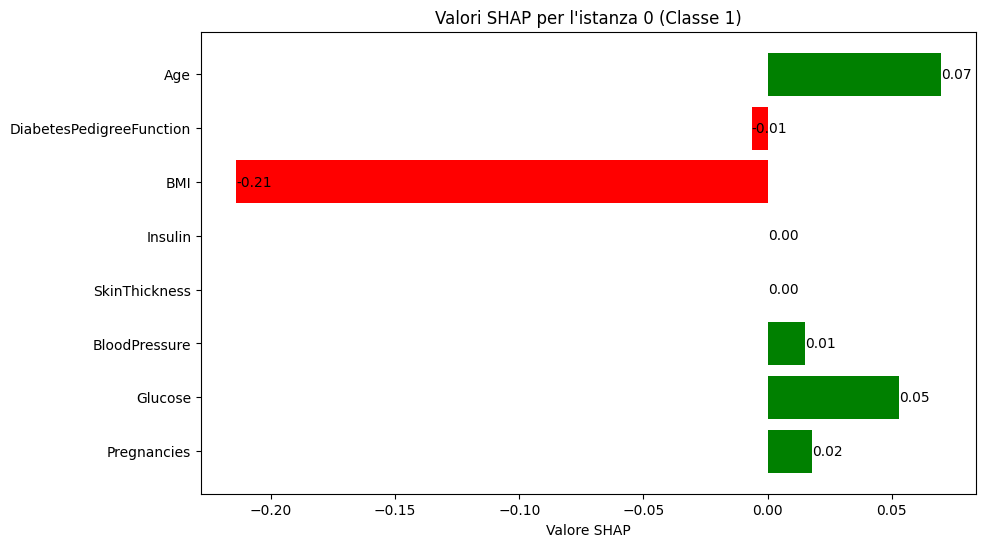

In [ ]:
import matplotlib.pyplot as plt

# Seleziona un'istanza specifica (ad esempio, la prima istanza)
instance_index = 0  # Cambia questo valore per scegliere un'altra istanza
instance = X_test.iloc[[instance_index]]  # Usa doppie parentesi per mantenere il formato DataFrame

# Calcola i valori SHAP per l'istanza specifica
shap_values_instance = shap_values[instance_index]
shap_values_instance_class_1 = shap_values_instance[:, 1]

colors = ['green' if value > 0 else 'red' for value in shap_values_instance_class_1]


# Bar plot dei valori SHAP per la classe 1
plt.figure(figsize=(10, 6))
bars = plt.barh(X_test.columns, shap_values_instance_class_1, color=colors)
plt.xlabel('Valore SHAP')
plt.title(f'Valori SHAP per l\'istanza {instance_index} (Classe 1)')

# Aggiungi i numeri sopra le barre
for bar in bars:
    plt.text(bar.get_width(), bar.get_y() + bar.get_height()/2,
             f'{bar.get_width():.2f}', va='center')

plt.show()


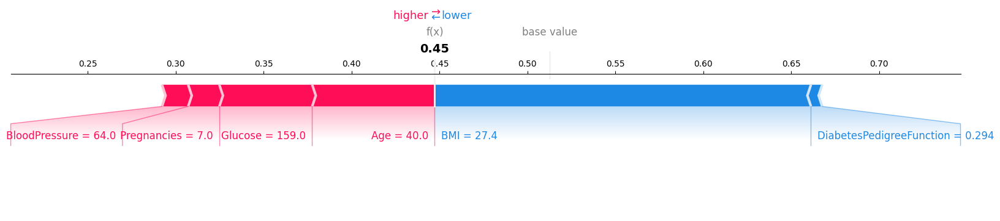

In [ ]:
# Seleziona una singola istanza da X_test (ad esempio la prima riga)
instance = X_test.iloc[[0]]

# Calcola i valori SHAP per tutte le classi (restituisce una lista di array per ciascuna classe)
shap_values = explainer.shap_values(instance)

# shap_values[0] per la classe 0 (nessun diabete) e shap_values[1] per la classe 1 (diabete)

# Visualizza la spiegazione locale usando un force plot per la classe 1 (diabete)
shap.force_plot(explainer.expected_value[0], shap_values[:,:,1], instance, matplotlib=True)


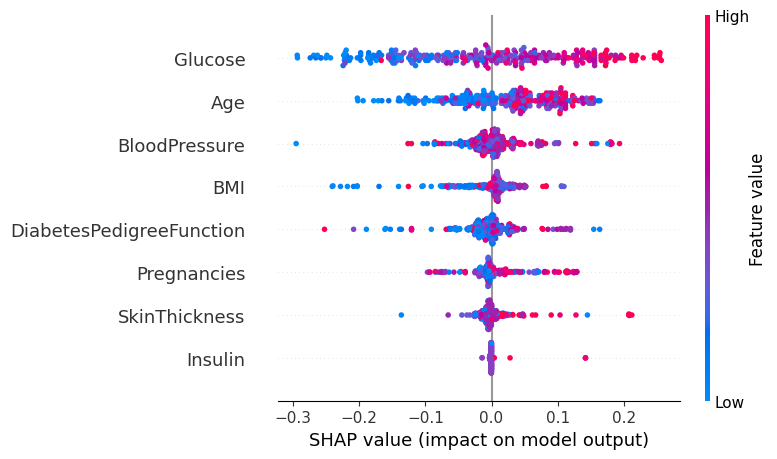

In [ ]:
import shap
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split


# Create and train DecisionTree model
dt = DecisionTreeClassifier(max_depth=50, min_samples_split=4)
dt.fit(X_train, y_train)

# Create a SHAP explainer
explainer = shap.TreeExplainer(dt)

# Calculate SHAP values
shap_values = explainer.shap_values(X_test)

# Create a SHAP plot for all features
shap.summary_plot(shap_values[:,:,0], X_test, show=True)

# RANDOM FOREST

In [ ]:
from sklearn.preprocessing import StandardScaler

ss = StandardScaler()

X_train = ss.fit_transform(X_train)
X_test = ss.fit_transform(X_test)

In [ ]:
from sklearn.ensemble import RandomForestClassifier
rf = RandomForestClassifier()
rf.fit(X_train,y_train)
train_pred_rf = rf.predict(X_train)
test_pred_rf = rf.predict(X_test)

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
print(classification_report(y_test,pred_rf))
#print(confusion_matrix(y_test,pred_rf))

              precision    recall  f1-score   support

           0       0.86      0.85      0.86       150
           1       0.86      0.87      0.86       150

    accuracy                           0.86       300
   macro avg       0.86      0.86      0.86       300
weighted avg       0.86      0.86      0.86       300



In [ ]:
from sklearn import metrics

# Metriche per il set di training
print('Accuracy train set:', metrics.accuracy_score(y_train, train_pred_rf))
print('Precision train set (weighted):', metrics.precision_score(y_train, train_pred_rf, average='weighted'))
print('Recall train set (weighted):', metrics.recall_score(y_train, train_pred_rf, average='weighted'))
print('F1 score train set (weighted):', metrics.f1_score(y_train, train_pred_rf, average='weighted'))

# Metriche per il set di test
print('Accuracy test set:', metrics.accuracy_score(y_test, test_pred_rf))
print('Precision test set (weighted):', metrics.precision_score(y_test, test_pred_rf, average='weighted'))
print('Recall test set (weighted):', metrics.recall_score(y_test, test_pred_rf, average='weighted'))
print('F1 score test set (weighted):', metrics.f1_score(y_test, test_pred_rf, average='weighted'))

Accuracy train set: 1.0
Precision train set (weighted): 1.0
Recall train set (weighted): 1.0
F1 score train set (weighted): 1.0
Accuracy test set: 0.8566666666666667
Precision test set (weighted): 0.8568093904228359
Recall test set (weighted): 0.8566666666666667
F1 score test set (weighted): 0.8566523318998566


In [ ]:
from sklearn.ensemble import RandomForestClassifier


# Create and train two Random Forest models with different criteria
clf_entropy = RandomForestClassifier(max_depth=10, max_features=10, min_samples_leaf=10, criterion='entropy', n_estimators=100)
clf_gini = RandomForestClassifier(max_depth=10, max_features=10, min_samples_leaf=10, criterion='gini', n_estimators=100)

clf_gini.fit(X_train, y_train)
clf_entropy.fit(X_train, y_train)

pred_rf = clf_gini.predict(X_test)
pred_rf2 = clf_entropy.predict(X_test)

from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
print(classification_report(y_test,pred_rf))
print(confusion_matrix(y_test,pred_rf2))

# Create LIME explainers for both models
explainer_entropy = lime.lime_tabular.LimeTabularExplainer(X_train.values, feature_names=X_train.columns, random_state=42)
explainer_gini = lime.lime_tabular.LimeTabularExplainer(X_train.values, feature_names=X_train.columns, random_state=42)

              precision    recall  f1-score   support

           0       0.83      0.77      0.80       150
           1       0.79      0.85      0.82       150

    accuracy                           0.81       300
   macro avg       0.81      0.81      0.81       300
weighted avg       0.81      0.81      0.81       300

[[115  35]
 [ 23 127]]


In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, precision_recall_fscore_support
import numpy as np

# Crea e addestra i modelli Random Forest
clf_entropy = RandomForestClassifier(max_depth=10, max_features=10, min_samples_leaf=10, criterion='entropy', n_estimators=100)
clf_gini = RandomForestClassifier(max_depth=10, max_features=10, min_samples_leaf=10, criterion='gini', n_estimators=100)

clf_gini.fit(X_train, y_train)
clf_entropy.fit(X_train, y_train)

# Previsioni sul set di test
pred_rf_gini = clf_gini.predict(X_test)
pred_rf_entropy = clf_entropy.predict(X_test)

# Previsioni sul set di training
train_pred_rf_gini = clf_gini.predict(X_train)
train_pred_rf_entropy = clf_entropy.predict(X_train)

# Funzione per calcolare e stampare tutte le metriche
def print_metrics(y_true, y_pred, y_pred_prob, dataset_name, model_name):
    print(f"\nMetrics for {model_name} on {dataset_name} set:")
    print("Classification Report:")
    print(classification_report(y_true, y_pred, target_names=['No Diabetes', 'Diabetes']))

    print("Confusion Matrix:")
    print(confusion_matrix(y_true, y_pred))

    print("Accuracy:", accuracy_score(y_true, y_pred))
    print("Precision (weighted):", precision_score(y_true, y_pred, average='weighted'))
    print("Recall (weighted):", recall_score(y_true, y_pred, average='weighted'))
    print("F1 Score (weighted):", f1_score(y_true, y_pred, average='weighted'))

    # ROC AUC
    if len(np.unique(y_true)) == 2:
        print("ROC AUC:", roc_auc_score(y_true, y_pred_prob[:, 1]))

    # Support (Precision, Recall, F1 per ogni classe)
    support_metrics = precision_recall_fscore_support(y_true, y_pred)
    print("Support (Precision, Recall, F1 per classe):", support_metrics)


print_metrics(y_train, train_pred_rf_gini, clf_gini.predict_proba(X_train), "train", "Random Forest (Gini)")
print_metrics(y_train, train_pred_rf_entropy, clf_entropy.predict_proba(X_train), "train", "Random Forest (Entropy)")

print_metrics(y_test, pred_rf_gini, clf_gini.predict_proba(X_test), "test", "Random Forest (Gini)")
print_metrics(y_test, pred_rf_entropy, clf_entropy.predict_proba(X_test), "test", "Random Forest (Entropy)")



Metrics for Random Forest (Gini) on train set:
Classification Report:
              precision    recall  f1-score   support

 No Diabetes       0.91      0.83      0.87       307
    Diabetes       0.84      0.91      0.87       292

    accuracy                           0.87       599
   macro avg       0.87      0.87      0.87       599
weighted avg       0.87      0.87      0.87       599

Confusion Matrix:
[[255  52]
 [ 26 266]]
Accuracy: 0.8697829716193656
Precision (weighted): 0.8728645715807448
Recall (weighted): 0.8697829716193656
F1 Score (weighted): 0.8696791407112668
ROC AUC: 0.9578889830886619
Support (Precision, Recall, F1 per classe): (array([0.90747331, 0.83647799]), array([0.83061889, 0.9109589 ]), array([0.86734694, 0.87213115]), array([307, 292]))

Metrics for Random Forest (Entropy) on train set:
Classification Report:
              precision    recall  f1-score   support

 No Diabetes       0.92      0.82      0.87       307
    Diabetes       0.83      0.92      

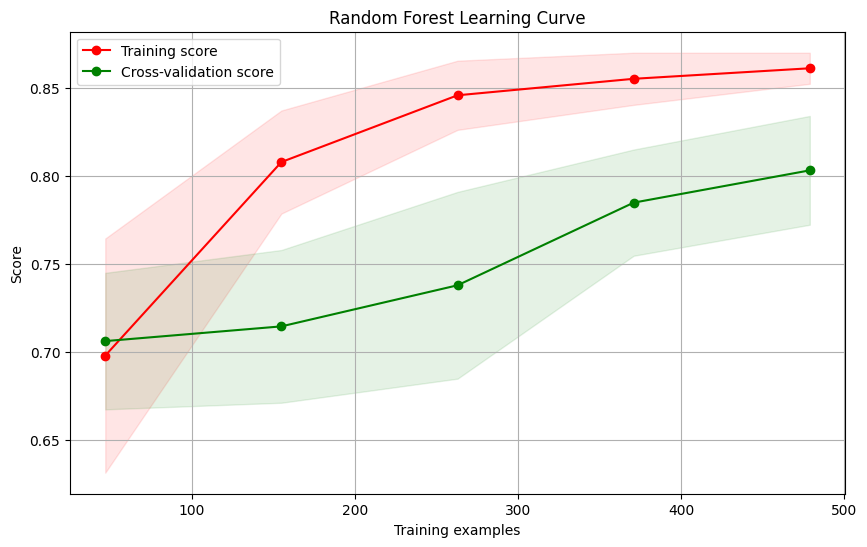

In [ ]:
plot_learning_curve(clf_entropy, "Random Forest Learning Curve", X_train, y_train)

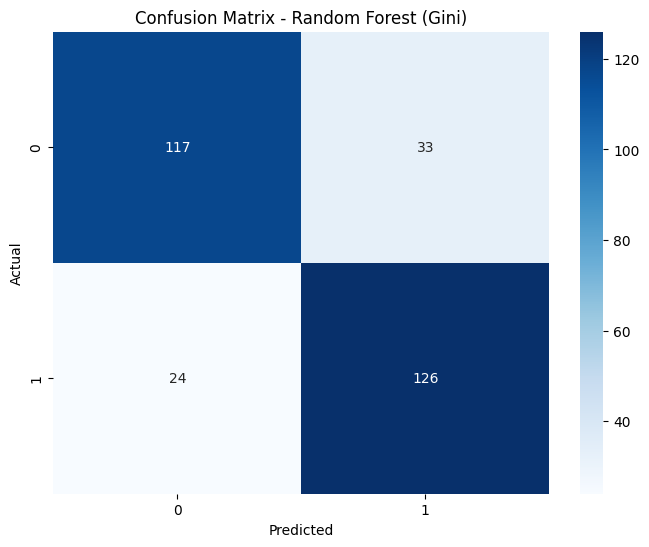

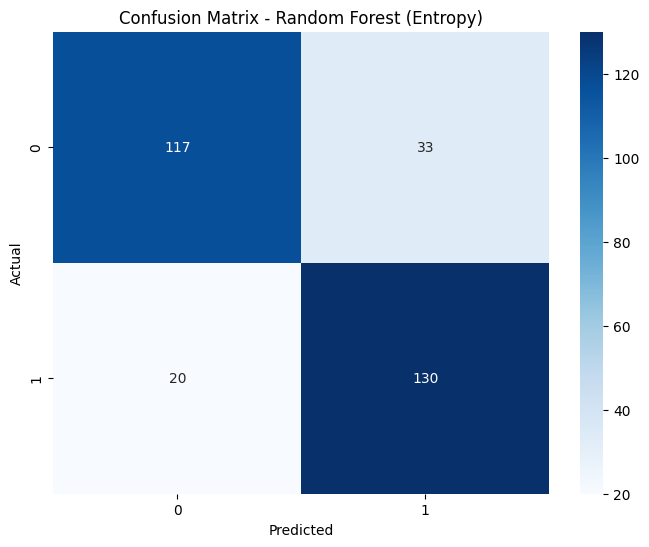

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

# Confusion Matrix per il modello Random Forest con criterio Gini
conf_matrix_gini = confusion_matrix(y_test, pred_rf)
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix_gini, annot=True, fmt="d", cmap='Blues')
plt.title('Confusion Matrix - Random Forest (Gini)')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

# Confusion matrix per il modello Random Forest con criterio Entropy
conf_matrix_entropy = confusion_matrix(y_test, pred_rf2)
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix_entropy, annot=True, fmt="d", cmap='Blues')
plt.title('Confusion Matrix - Random Forest (Entropy)')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()


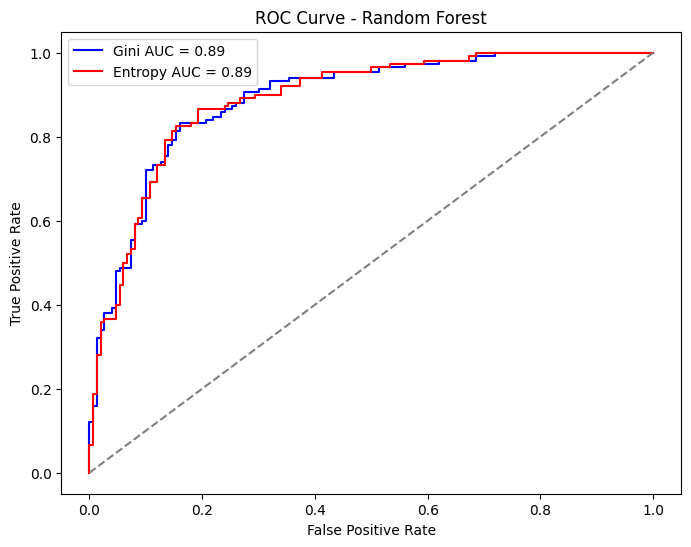

In [ ]:
from sklearn.metrics import roc_curve, auc

# Predire le probabilità per Random Forest (Gini)
y_test_pred_prob_gini = clf_gini.predict_proba(X_test)[:, 1]
fpr_gini, tpr_gini, _ = roc_curve(y_test, y_test_pred_prob_gini)
roc_auc_gini = auc(fpr_gini, tpr_gini)

# Predire le probabilità per Random Forest (Entropy)
y_test_pred_prob_entropy = clf_entropy.predict_proba(X_test)[:, 1]
fpr_entropy, tpr_entropy, _ = roc_curve(y_test, y_test_pred_prob_entropy)
roc_auc_entropy = auc(fpr_entropy, tpr_entropy)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr_gini, tpr_gini, color='blue', label=f'Gini AUC = {roc_auc_gini:.2f}')
plt.plot(fpr_entropy, tpr_entropy, color='red', label=f'Entropy AUC = {roc_auc_entropy:.2f}')
plt.plot([0, 1], [0, 1], color='grey', linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - Random Forest')
plt.legend()
plt.show()


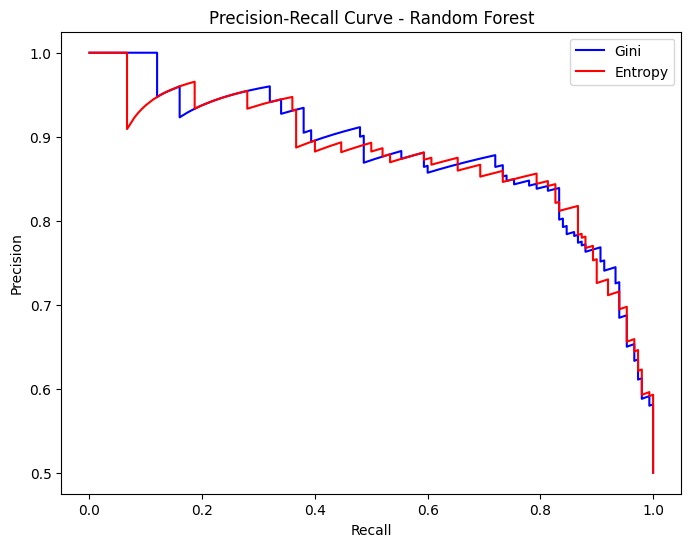

In [ ]:
from sklearn.metrics import precision_recall_curve

# Curva precision-recall per il modello Random Forest (Gini)
precision_gini, recall_gini, _ = precision_recall_curve(y_test, y_test_pred_prob_gini)

# Curva precision-recall per il modello Random Forest (Entropy)
precision_entropy, recall_entropy, _ = precision_recall_curve(y_test, y_test_pred_prob_entropy)

plt.figure(figsize=(8, 6))
plt.plot(recall_gini, precision_gini, color='blue', label='Gini')
plt.plot(recall_entropy, precision_entropy, color='red', label='Entropy')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve - Random Forest')
plt.legend()
plt.show()


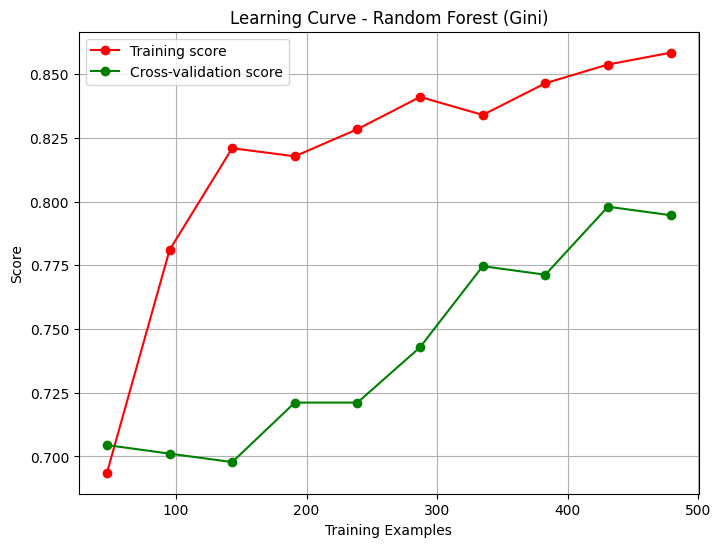

In [ ]:
from sklearn.model_selection import learning_curve
import numpy as np

train_sizes, train_scores, test_scores = learning_curve(clf_gini, X_train, y_train, cv=5, scoring='accuracy', n_jobs=-1, train_sizes=np.linspace(0.1, 1.0, 10))

train_scores_mean = np.mean(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)

plt.figure(figsize=(8, 6))
plt.plot(train_sizes, train_scores_mean, 'o-', color="r", label="Training score")
plt.plot(train_sizes, test_scores_mean, 'o-', color="g", label="Cross-validation score")
plt.title('Learning Curve - Random Forest (Gini)')
plt.xlabel('Training Examples')
plt.ylabel('Score')
plt.legend(loc="best")
plt.grid()
plt.show()


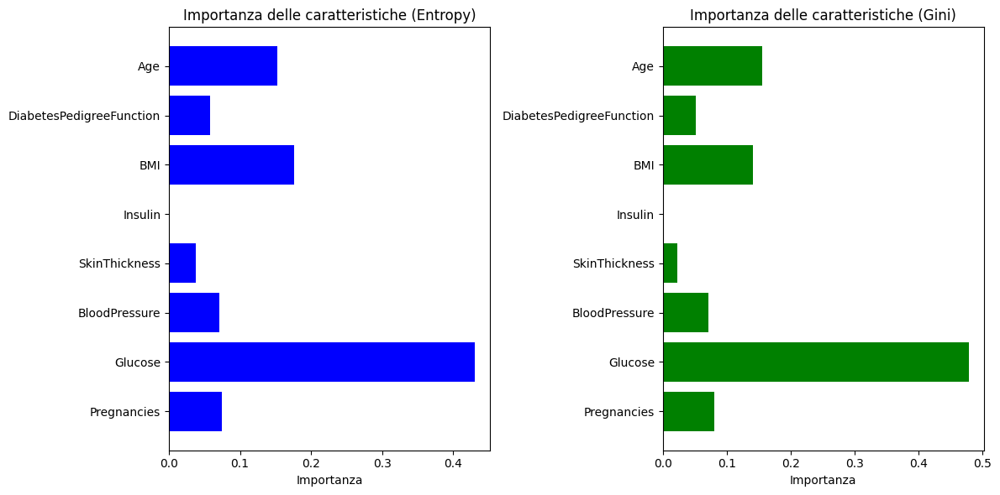

In [ ]:
importances_entropy = clf_entropy.feature_importances_
feature_names = X_train.columns

# Importanza delle feature per il modello 'gini'
importances_gini = clf_gini.feature_importances_

# Visualizzazione delle importanze per il modello 'entropy'
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.barh(feature_names, importances_entropy, color='blue')
plt.xlabel('Importanza')
plt.title('Importanza delle caratteristiche (Entropy)')

# Visualizzazione delle importanze per il modello 'gini'
plt.subplot(1, 2, 2)
plt.barh(feature_names, importances_gini, color='green')
plt.xlabel('Importanza')
plt.title('Importanza delle caratteristiche (Gini)')

plt.tight_layout()
plt.show()

LIME

In [ ]:
import lime.lime_tabular

# Supponiamo che vogliamo spiegare la prima predizione del test set
idx = 0

# Spiegazione per il modello Random Forest (Entropy)
exp_entropy = explainer_entropy.explain_instance(X_test.iloc[idx].values, clf_entropy.predict_proba, num_features=5)
exp_entropy.show_in_notebook()

# Spiegazione per il modello Random Forest (Gini)
exp_gini = explainer_gini.explain_instance(X_test.iloc[idx].values, clf_gini.predict_proba, num_features=5)
exp_gini.show_in_notebook()

In [ ]:
# Explain Lime predictions for the first test set instance
explanation_entropy = explainer_entropy.explain_instance(X_test.iloc[0], clf_entropy.predict_proba, num_features=len(X_train.columns), top_labels=0)
explanation_gini = explainer_gini.explain_instance(X_test.iloc[0], clf_gini.predict_proba, num_features=len(X_train.columns), top_labels=0)
explanation_entropy.show_in_notebook(show_table=True, show_all=True)
explanation_gini.show_in_notebook(show_table=True, show_all=True)

SHAP

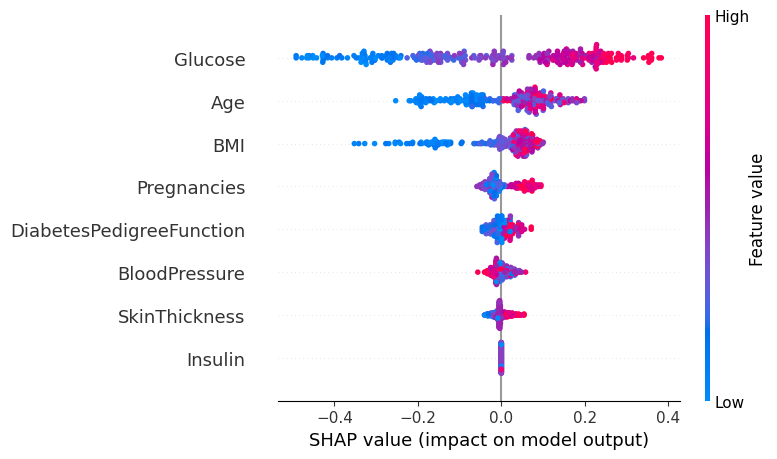

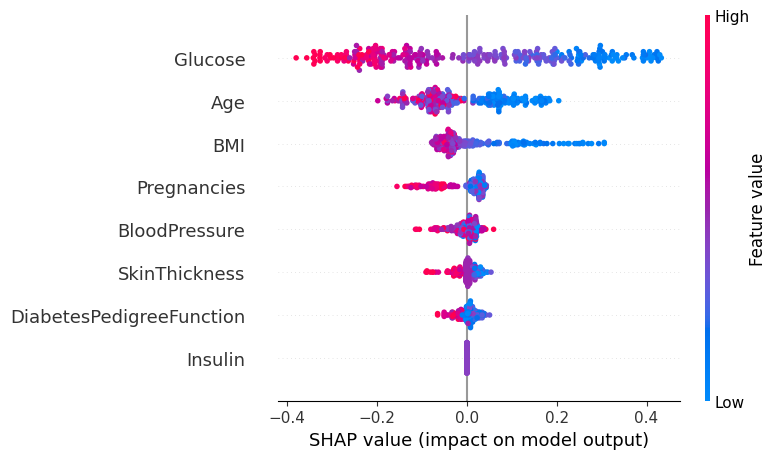

In [ ]:
import shap
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split


# Create and train two Random Forest models with different criteria
clf_entropy = RandomForestClassifier(max_depth=10, max_features=10, min_samples_leaf=10, criterion='entropy', n_estimators=100)
clf_gini = RandomForestClassifier(max_depth=10, max_features=10, min_samples_leaf=10, criterion='gini', n_estimators=100)

clf_gini.fit(X_train, y_train)
clf_entropy.fit(X_train, y_train)

# Create SHAP explainers for both models
explainer_entropy = shap.TreeExplainer(clf_entropy)
explainer_gini = shap.TreeExplainer(clf_gini)

# Calculate SHAP values for the test set for both models
shap_values_entropy = explainer_entropy.shap_values(X_test)
shap_values_gini = explainer_gini.shap_values(X_test)

# Create SHAP summary plots for both models
shap.summary_plot(shap_values_entropy[:,:,1], X_test, show=True)
shap.summary_plot(shap_values_gini[:,:,0], X_test, show=True)

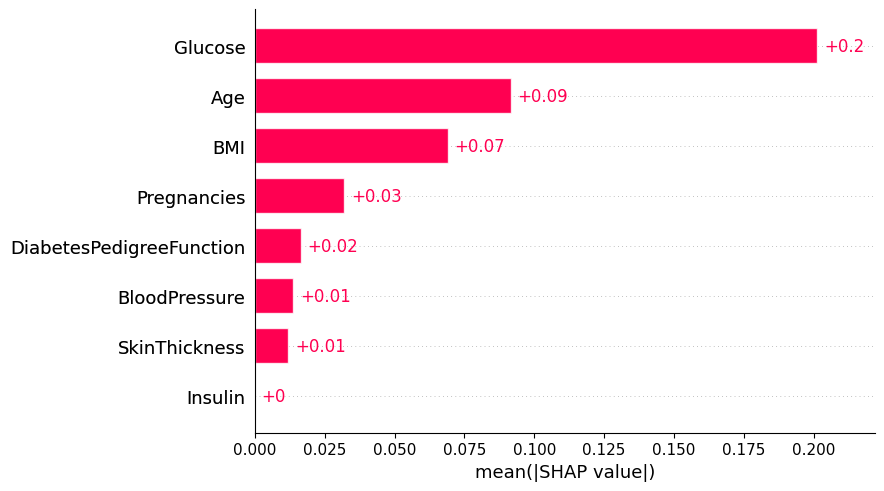

In [ ]:
shap_value_bar_general = explainer_entropy(X_test)
shap.plots.bar(shap_value_bar_general[:,:,0], max_display=10, show=True)

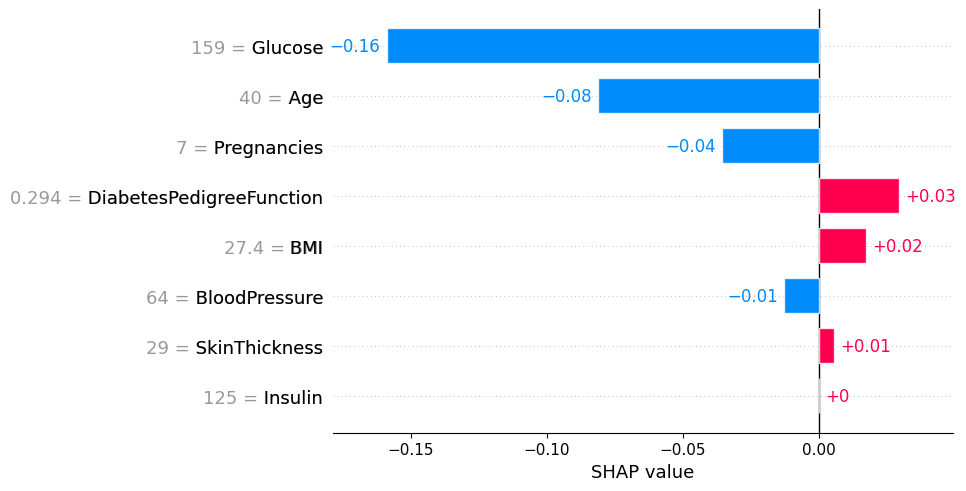

In [ ]:
shap_value_bar_1 = explainer_entropy(X_test.iloc[0])
shap.plots.bar(shap_value_bar_1[:,0], max_display=10, show=True)

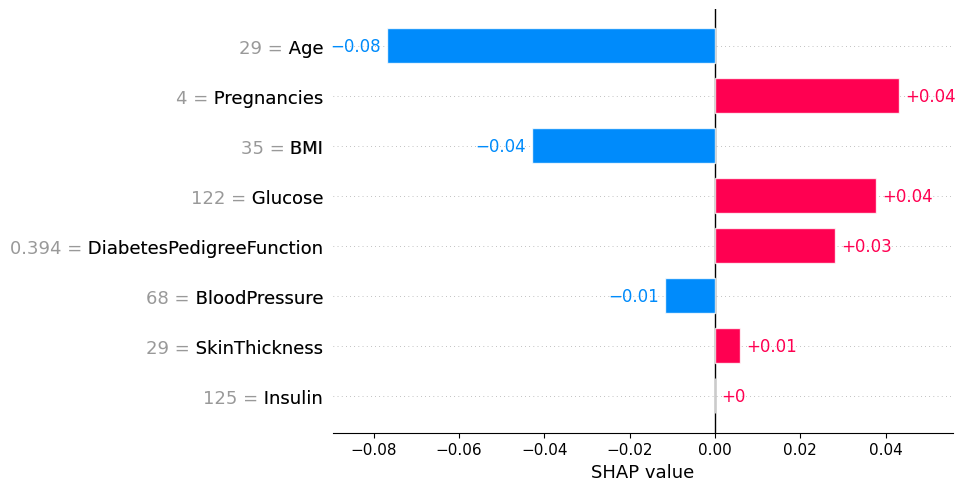

In [ ]:
shap_value_bar_2 = explainer_entropy(X_test.iloc[105])
shap.plots.bar(shap_value_bar_2[:,0], max_display=10, show=True)

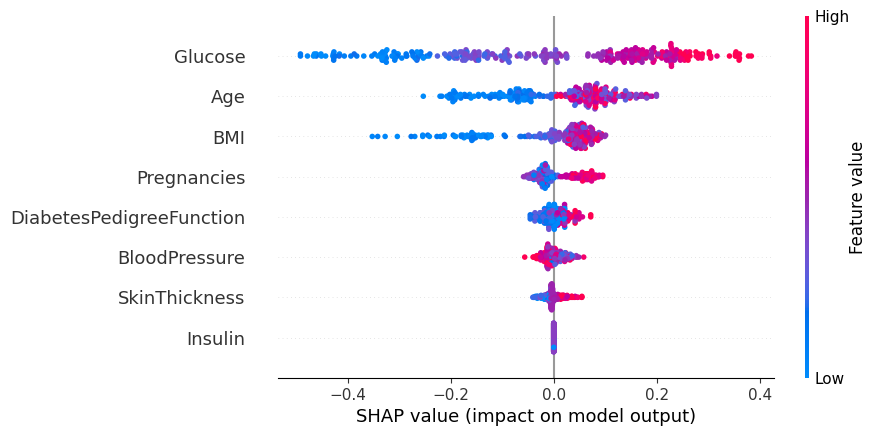

In [ ]:
shap.plots.beeswarm(shap_value_bar_general[:,:,1])


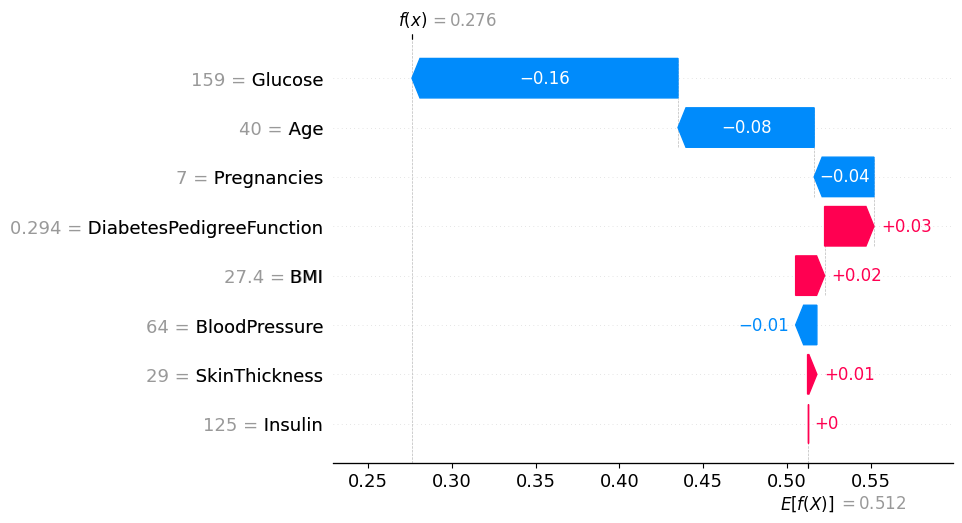

In [ ]:
shap.plots.waterfall(shap_value_bar_general[0,:,0]) #False prediction on istance 0


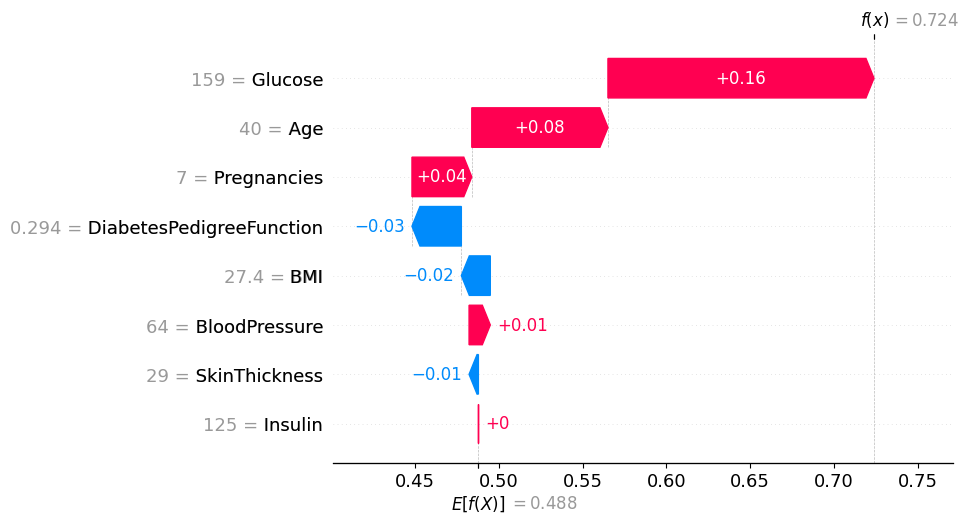

In [ ]:
shap.plots.waterfall(shap_value_bar_general[0,:,1]) #True predicition on instance 0


# CATBOOST

In [ ]:
from catboost import CatBoostClassifier, Pool


In [ ]:
# Creazione del modello CatBoost
catboost_model = CatBoostClassifier(
    iterations=500,        # Numero di iterazioni (albero)
    depth=6,               # Profondità massima dell'albero
    learning_rate=0.1,     # Tasso di apprendimento
    loss_function='Logloss',  # Funzione di perdita per classificazione binaria
    eval_metric='Accuracy'  # Metriche di valutazione
)

# Allenamento del modello
catboost_model.fit(X_train, y_train, eval_set=(X_test, y_test), verbose=100)


0:	learn: 0.7629382	test: 0.7466667	best: 0.7466667 (0)	total: 10.9ms	remaining: 5.43s
100:	learn: 0.9799666	test: 0.8400000	best: 0.8633333 (83)	total: 1.23s	remaining: 4.85s
200:	learn: 1.0000000	test: 0.8266667	best: 0.8633333 (83)	total: 1.91s	remaining: 2.84s
300:	learn: 1.0000000	test: 0.8133333	best: 0.8633333 (83)	total: 2.67s	remaining: 1.77s
400:	learn: 1.0000000	test: 0.8166667	best: 0.8633333 (83)	total: 3.6s	remaining: 890ms
499:	learn: 1.0000000	test: 0.8100000	best: 0.8633333 (83)	total: 4.17s	remaining: 0us

bestTest = 0.8633333333
bestIteration = 83

Shrink model to first 84 iterations.


In [ ]:
# Predizioni
train_pred_catboost = catboost_model.predict(X_train)
test_pred_catboost = catboost_model.predict(X_test)

# Valutazione per il set di training
print('Accuracy train set (CatBoost):', metrics.accuracy_score(y_train, train_pred_catboost))
print('Precision train set (CatBoost - weighted):', metrics.precision_score(y_train, train_pred_catboost, average='weighted'))
print('Recall train set (CatBoost - weighted):', metrics.recall_score(y_train, train_pred_catboost, average='weighted'))
print('F1 score train set (CatBoost - weighted):', metrics.f1_score(y_train, train_pred_catboost, average='weighted'))

# Valutazione per il set di test
print('Accuracy test set (CatBoost):', metrics.accuracy_score(y_test, test_pred_catboost))
print('Precision test set (CatBoost - weighted):', metrics.precision_score(y_test, test_pred_catboost, average='weighted'))
print('Recall test set (CatBoost - weighted):', metrics.recall_score(y_test, test_pred_catboost, average='weighted'))
print('F1 score test set (CatBoost - weighted):', metrics.f1_score(y_test, test_pred_catboost, average='weighted'))


NameError: name 'metrics' is not defined

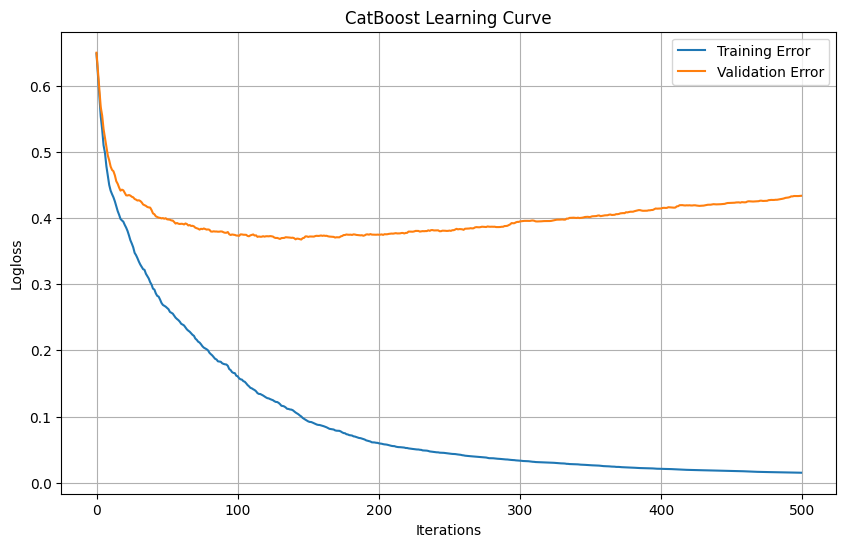

In [ ]:
train_error = catboost_model.get_evals_result()['learn']['Logloss']
test_error = catboost_model.get_evals_result()['validation']['Logloss']

plt.figure(figsize=(10, 6))
plt.plot(train_error, label='Training Error')
plt.plot(test_error, label='Validation Error')
plt.title('CatBoost Learning Curve')
plt.xlabel('Iterations')
plt.ylabel('Logloss')
plt.legend()
plt.grid()
plt.show()

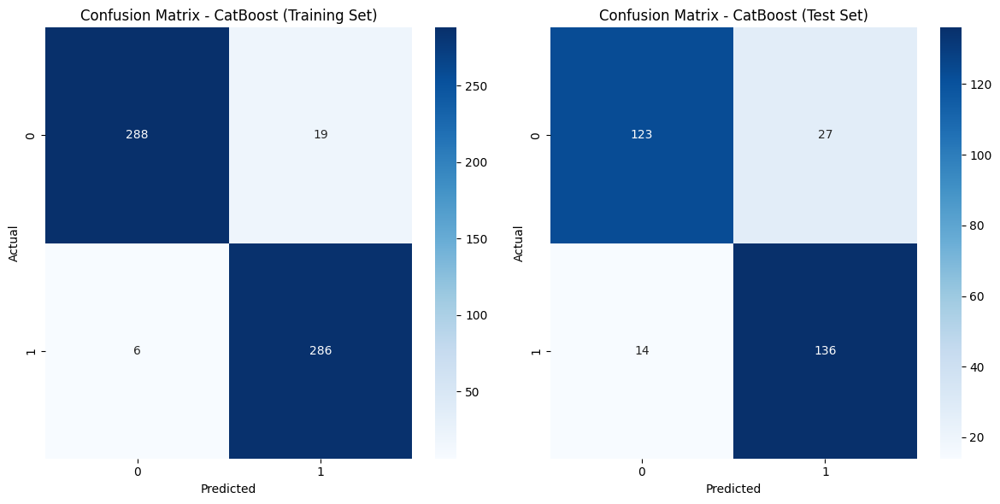

In [ ]:
# Matrice di confusione per il training set
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
sns.heatmap(confusion_matrix(y_train, train_pred_catboost), annot=True, fmt="d", cmap='Blues')
plt.title('Confusion Matrix - CatBoost (Training Set)')
plt.xlabel('Predicted')
plt.ylabel('Actual')

# Matrice di confusione per il test set
plt.subplot(1, 2, 2)
sns.heatmap(confusion_matrix(y_test, test_pred_catboost), annot=True, fmt="d", cmap='Blues')
plt.title('Confusion Matrix - CatBoost (Test Set)')
plt.xlabel('Predicted')
plt.ylabel('Actual')

plt.tight_layout()
plt.show()


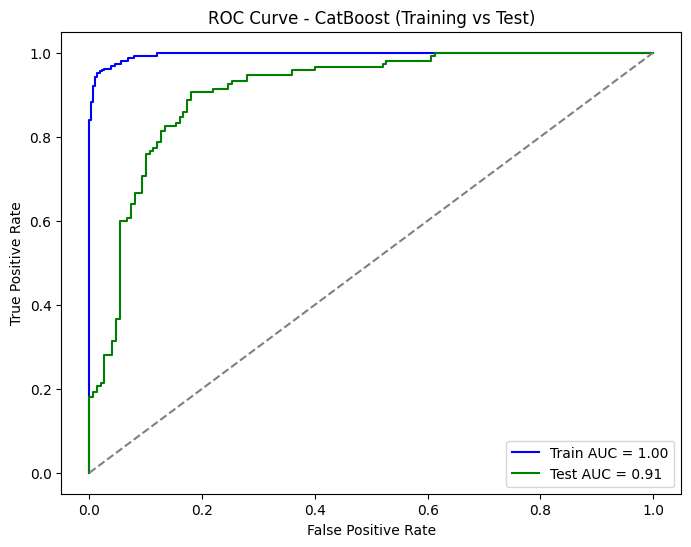

In [ ]:
from sklearn.metrics import roc_curve, auc

# Probabilità predette per il training e test set
y_train_pred_prob_catboost = catboost_model.predict_proba(X_train)[:, 1]
y_test_pred_prob_catboost = catboost_model.predict_proba(X_test)[:, 1]

# Curva ROC per il training set
fpr_train_catboost, tpr_train_catboost, _ = roc_curve(y_train, y_train_pred_prob_catboost)
roc_auc_train_catboost = auc(fpr_train_catboost, tpr_train_catboost)

# Curva ROC per il test set
fpr_test_catboost, tpr_test_catboost, _ = roc_curve(y_test, y_test_pred_prob_catboost)
roc_auc_test_catboost = auc(fpr_test_catboost, tpr_test_catboost)

# Plot ROC curve per training e test set
plt.figure(figsize=(8, 6))
plt.plot(fpr_train_catboost, tpr_train_catboost, color='blue', label=f'Train AUC = {roc_auc_train_catboost:.2f}')
plt.plot(fpr_test_catboost, tpr_test_catboost, color='green', label=f'Test AUC = {roc_auc_test_catboost:.2f}')
plt.plot([0, 1], [0, 1], color='grey', linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - CatBoost (Training vs Test)')
plt.legend()
plt.show()


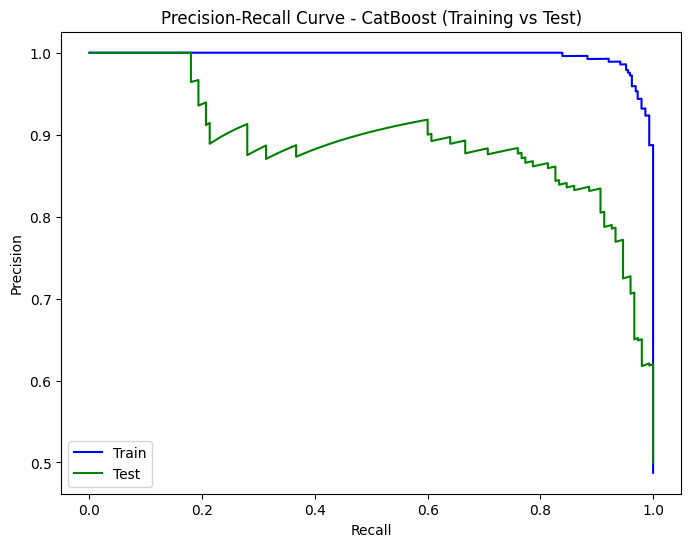

In [ ]:
from sklearn.metrics import precision_recall_curve

# Precision-Recall curve per il training set
precision_train_catboost, recall_train_catboost, _ = precision_recall_curve(y_train, y_train_pred_prob_catboost)

# Precision-Recall curve per il test set
precision_test_catboost, recall_test_catboost, _ = precision_recall_curve(y_test, y_test_pred_prob_catboost)

# Plot Precision-Recall curve per training e test set
plt.figure(figsize=(8, 6))
plt.plot(recall_train_catboost, precision_train_catboost, color='blue', label='Train')
plt.plot(recall_test_catboost, precision_test_catboost, color='green', label='Test')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve - CatBoost (Training vs Test)')
plt.legend()
plt.show()


SHAP

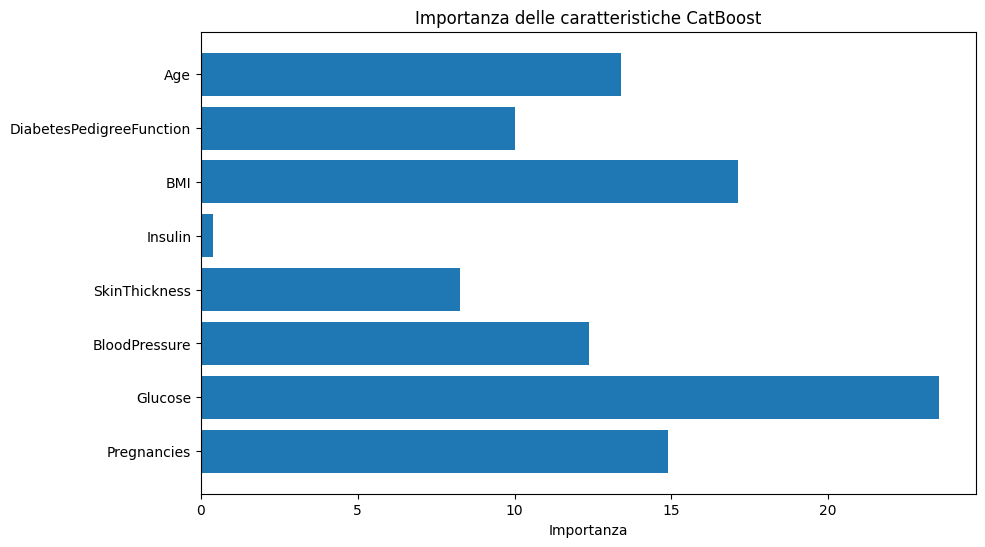

In [ ]:
# Importanza delle caratteristiche
importances = catboost_model.get_feature_importance()
feature_names = X_train.columns

# Visualizzazione delle importanze
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.barh(feature_names, importances)
plt.xlabel('Importanza')
plt.title('Importanza delle caratteristiche CatBoost')
plt.show()


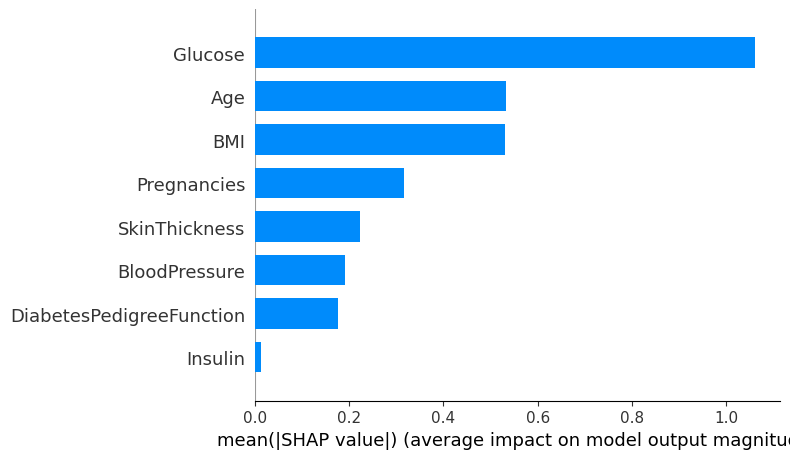

In [ ]:
import shap

# Creazione di un oggetto SHAP explainer
explainer = shap.Explainer(catboost_model)

# Calcolo dei valori SHAP
shap_values = explainer(X_test)

# Creazione di un grafico di riepilogo
shap.summary_plot(shap_values, X_test, plot_type="bar", show=True)


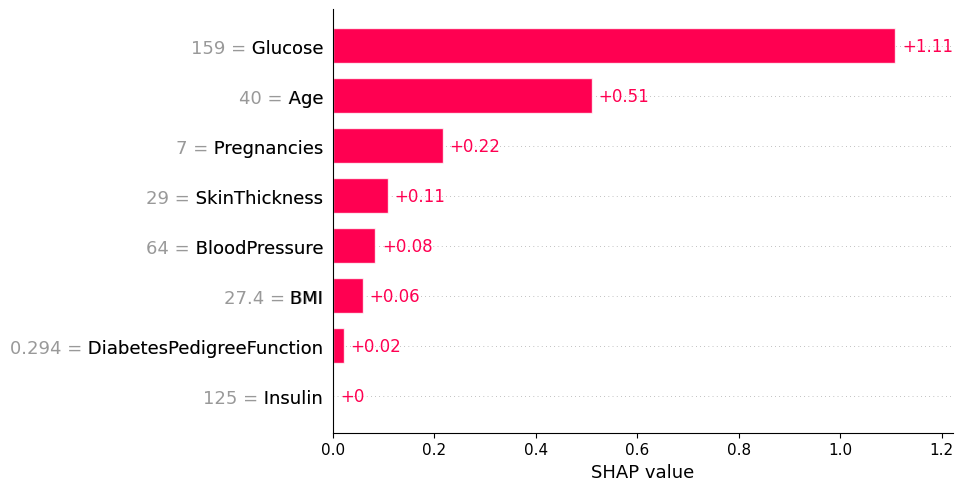

In [ ]:
shap_value_bar_1 = explainer(X_test)
shap.plots.bar(shap_value_bar_1[0], max_display=10, show=True)

LIME

In [ ]:
import numpy as np
import pandas as pd
import lime
import lime.lime_tabular

# Converti i dati in array numpy
train_set_np = X_train.to_numpy()
test_set_np = X_test.to_numpy()

# Funzione di previsione per LIME
def predict_fn(X):
    return catboost_model.predict_proba(X)

    # Crea un oggetto LimeTabularExplainer
explainer = lime.lime_tabular.LimeTabularExplainer(
    training_data=train_set_np,
    feature_names=X_train.columns,
    class_names=['0', '1'],
    mode='classification'
)

# Seleziona una riga dal set di test per la spiegazione
i = 189  # Indice della riga da spiegare
instance = test_set_np[i].reshape(1, -1)

# Ottieni l'oggetto Explanation
explanation = explainer.explain_instance(
    instance[0],  # L'istanza da spiegare
    predict_fn,   # La funzione di previsione
    num_features=10  # Numero di caratteristiche da mostrare nella spiegazione
)
# Visualizza la spiegazione
explanation.show_in_notebook(show_table=True, show_all=False)


# NEURAL NETWORK

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from tensorflow.keras.utils import to_categorical

X = df.drop('Outcome',axis = 1)
y = df['Outcome']
X= pd.get_dummies(X)

y = to_categorical(y, num_classes=2)

# Normalizzazione dei dati
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

X_train_val, X_test, y_train_val, y_test = train_test_split(
    X, y, test_size=0.30, random_state=42  # 30% for test set
)


X_train, X_val, y_train, y_val = train_test_split(
    X_train_val, y_train_val, test_size=0.10 / 0.70, random_state=42  # 10% of 70% for validation set
)

print(f"Training set shape: {X_train.shape}")
print(f"Validation set shape: {X_val.shape}")
print(f"Test set shape: {X_test.shape}")



Training set shape: (599, 8)
Validation set shape: (101, 8)
Test set shape: (300, 8)


In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.optimizers import Adam

# Creazione del modello
model = Sequential([
    Dense(64, activation='relu', input_shape=(X_train.shape[1],)),
    Dense(32, activation='relu'),
    Dense(2, activation='softmax')  # Output layer per classificazione binaria
])

# Compilazione del modello
model.compile(optimizer=Adam(), loss='categorical_crossentropy', metrics=['accuracy'])

# Addestramento del modello
history = model.fit(X_train, y_train, epochs=20, batch_size=32, validation_split=0.2)


Epoch 1/20
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - accuracy: 0.4796 - loss: 18.8415 - val_accuracy: 0.5083 - val_loss: 5.2589
Epoch 2/20
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5320 - loss: 4.2695 - val_accuracy: 0.5333 - val_loss: 2.3353
Epoch 3/20
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6103 - loss: 1.3708 - val_accuracy: 0.6167 - val_loss: 0.8400
Epoch 4/20
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6813 - loss: 0.7519 - val_accuracy: 0.6333 - val_loss: 0.6762
Epoch 5/20
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7139 - loss: 0.5876 - val_accuracy: 0.6417 - val_loss: 0.6411
Epoch 6/20
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7284 - loss: 0.5631 - val_accuracy: 0.6667 - val_loss: 0.6117
Epoch 7/20
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.6880 - loss: 0.6081 - val_accuracy: 0.6583 - val_loss: 0.5784
Epoch 8/20
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.6916 - loss: 0.5534 - val_accuracy: 0.6667 - val_los

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, precision_recall_fscore_support
import numpy as np

# Previsioni sul set di training
y_train_pred_prob = model.predict(X_train)
y_train_pred = np.argmax(y_train_pred_prob, axis=1)
y_train_true = np.argmax(y_train, axis=1)

# Previsioni sul set di test
y_test_pred_prob = model.predict(X_test)
y_test_pred = np.argmax(y_test_pred_prob, axis=1)
y_test_true = np.argmax(y_test, axis=1)

# Funzione per calcolare tutte le metriche
def print_metrics(y_true, y_pred, y_pred_prob, dataset_name):
    print(f"\nMetrics for {dataset_name} set:")
    print("Classification Report:")
    print(classification_report(y_true, y_pred, target_names=['No Diabetes', 'Diabetes']))

    print("Confusion Matrix:")
    print(confusion_matrix(y_true, y_pred))

    print("Accuracy:", accuracy_score(y_true, y_pred))
    print("Precision (weighted):", precision_score(y_true, y_pred, average='weighted'))
    print("Recall (weighted):", recall_score(y_true, y_pred, average='weighted'))
    print("F1 Score (weighted):", f1_score(y_true, y_pred, average='weighted'))

    # ROC AUC (solo per problemi binari)
    if len(np.unique(y_true)) == 2:  # Se hai solo due classi (No Diabetes, Diabetes)
        print("ROC AUC:", roc_auc_score(y_true, y_pred_prob[:, 1]))

    # Support (Precision, Recall, F1 per ogni classe)
    support_metrics = precision_recall_fscore_support(y_true, y_pred)
    print("Support (Precision, Recall, F1 per classe):", support_metrics)

# Stampa delle metriche per il set di training
print_metrics(y_train_true, y_train_pred, y_train_pred_prob, "train")

# Stampa delle metriche per il set di test
print_metrics(y_test_true, y_test_pred, y_test_pred_prob, "test")


19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 

Metrics for train set:
Classification Report:
              precision    recall  f1-score   support

 No Diabetes       0.90      0.62      0.73       307
    Diabetes       0.70      0.92      0.79       292

    accuracy                           0.77       599
   macro avg       0.80      0.77      0.76       599
weighted avg       0.80      0.77      0.76       599

Confusion Matrix:
[[189 118]
 [ 22 270]]
Accuracy: 0.7662771285475793
Precision (weighted): 0.7983078424301736
Recall (weighted): 0.7662771285475793
F1 Score (weighted): 0.7611174957732947
ROC AUC: 0.8462919994645486
Support (Precision, Recall, F1 per classe): (array([0.8957346 , 0.69587629]), array([0.61563518, 0.92465753]), array([0.72972973, 0.79411765]), array([307, 292]))

Metrics for test set:
Classification Report:
              precision    recall  f1-score   support

 No Diabetes       0.86      0.64      0.74       150
    Diabetes

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


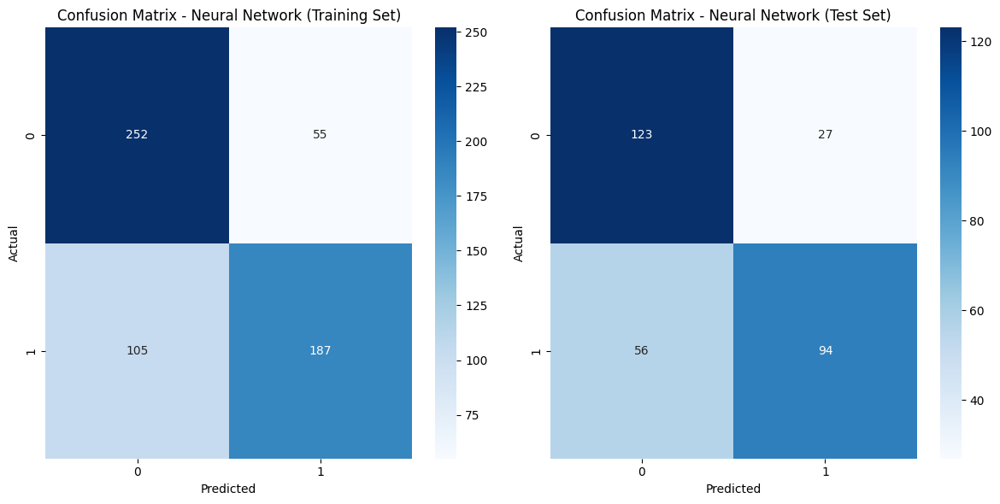

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

# Previsioni sul set di addestramento
y_train_pred_prob = model.predict(X_train)
y_train_pred = np.argmax(y_train_pred_prob, axis=1)
y_train_true = np.argmax(y_train, axis=1)

# Matrice di confusione per il training set
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
sns.heatmap(confusion_matrix(y_train_true, y_train_pred), annot=True, fmt="d", cmap='Blues')
plt.title('Confusion Matrix - Neural Network (Training Set)')
plt.xlabel('Predicted')
plt.ylabel('Actual')

# Matrice di confusione per il test set
plt.subplot(1, 2, 2)
sns.heatmap(confusion_matrix(y_true, y_pred), annot=True, fmt="d", cmap='Blues')
plt.title('Confusion Matrix - Neural Network (Test Set)')
plt.xlabel('Predicted')
plt.ylabel('Actual')

plt.tight_layout()
plt.show()


19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


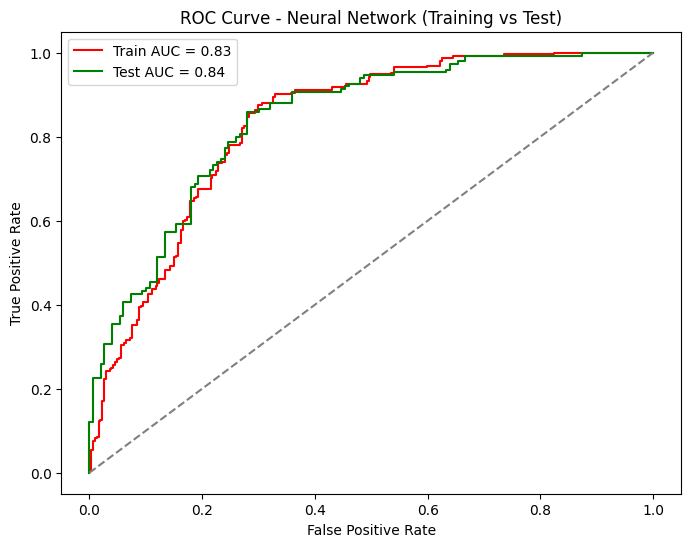

In [ ]:
from sklearn.metrics import roc_curve, auc

# Probabilità predette per il training e test set
y_train_pred_prob = model.predict(X_train)
y_train_pred_prob = y_train_pred_prob[:, 1]  # Prendi solo la probabilità della classe positiva
y_test_pred_prob = model.predict(X_test)
y_test_pred_prob = y_test_pred_prob[:, 1]

# Curva ROC per il training set
fpr_train, tpr_train, _ = roc_curve(y_train_true, y_train_pred_prob)
roc_auc_train = auc(fpr_train, tpr_train)

# Curva ROC per il test set
fpr_test, tpr_test, _ = roc_curve(y_true, y_test_pred_prob)
roc_auc_test = auc(fpr_test, tpr_test)

# Plot ROC curve per training e test set
plt.figure(figsize=(8, 6))
plt.plot(fpr_train, tpr_train, color='red', label=f'Train AUC = {roc_auc_train:.2f}')
plt.plot(fpr_test, tpr_test, color='green', label=f'Test AUC = {roc_auc_test:.2f}')
plt.plot([0, 1], [0, 1], color='grey', linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - Neural Network (Training vs Test)')
plt.legend()
plt.show()


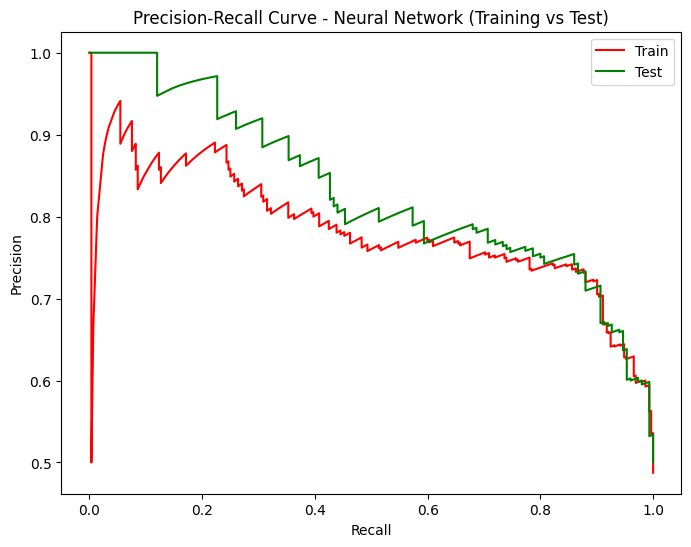

In [ ]:
from sklearn.metrics import precision_recall_curve

# Precision-Recall curve per il training set
precision_train, recall_train, _ = precision_recall_curve(y_train_true, y_train_pred_prob)

# Precision-Recall curve per il test set
precision_test, recall_test, _ = precision_recall_curve(y_true, y_test_pred_prob)

# Plot Precision-Recall curve per training e test set
plt.figure(figsize=(8, 6))
plt.plot(recall_train, precision_train, color='red', label='Train')
plt.plot(recall_test, precision_test, color='green', label='Test')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve - Neural Network (Training vs Test)')
plt.legend()
plt.show()


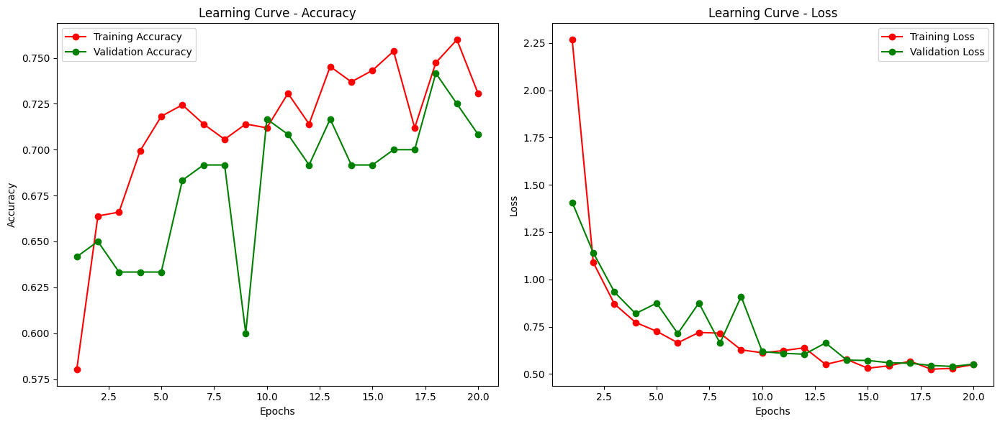

In [ ]:
# Estrazione dei valori dalla storicità dell'addestramento
epochs = range(1, len(history.history['accuracy']) + 1)
train_acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
train_loss = history.history['loss']
val_loss = history.history['val_loss']

# Plot della curva di apprendimento per Accuracy e Loss
plt.figure(figsize=(14, 6))

# Subplot per Accuracy
plt.subplot(1, 2, 1)
plt.plot(epochs, train_acc, 'o-', color='red', label='Training Accuracy')
plt.plot(epochs, val_acc, 'o-', color='green', label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Learning Curve - Accuracy')
plt.legend()

# Subplot per Loss
plt.subplot(1, 2, 2)
plt.plot(epochs, train_loss, 'o-', color='red', label='Training Loss')
plt.plot(epochs, val_loss, 'o-', color='green', label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Learning Curve - Loss')
plt.legend()

plt.tight_layout()
plt.show()


In [ ]:
X_train = X_train.to_numpy()
X_test = X_test.to_numpy()

In [ ]:
import lime
import lime.lime_tabular

# Creazione di un oggetto LIME Explainer
explainer = lime.lime_tabular.LimeTabularExplainer(
    training_data=X_train,
    feature_names=df.drop('Outcome', axis=1).columns,
    class_names=['No Diabetes', 'Diabetes'],
    mode='classification'
)

# Seleziona un'istanza dal set di test per la spiegazione
i = 0  # Indice dell'istanza da spiegare
instance = X_test[i].reshape(1, -1)

# Spiegazione con LIME
def predict_fn(x):
    return model.predict(x)

explanation = explainer.explain_instance(
    instance[0],
    predict_fn,
    num_features=10
)

# Visualizzazione della spiegazione
explanation.show_in_notebook(show_table=True, show_all=False)


157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


  0%|          | 0/100 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
794/794 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
794/794 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
794/794 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
794/794 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
794/794 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
794/794 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
794/794 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
794/794 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
794/794 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
794/794 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
794/794 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
794/794 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
794/794 ━━━━━━

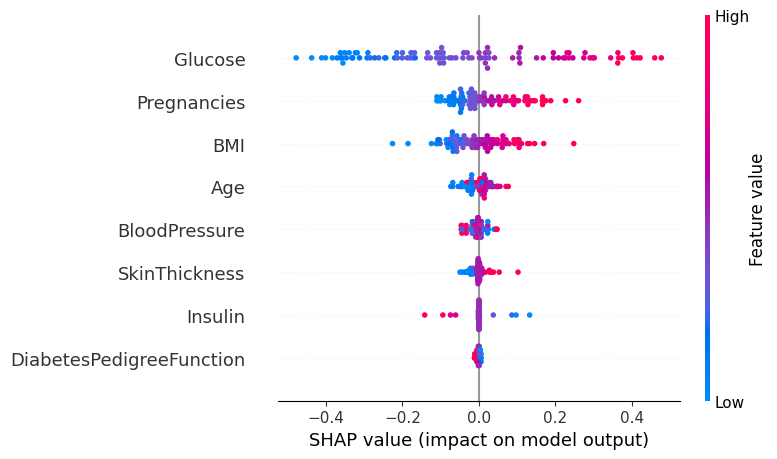

In [ ]:
# Calcolo dei valori SHAP per un sottoinsieme del set di test
shap_values = explainer(X_test[:100])

# Visualizzazione dei valori SHAP
shap.summary_plot(shap_values[:,:,1], X_test[:100], feature_names=df.drop('Outcome', axis=1).columns)

# MedRAG predictions

In [ ]:
df3 = pd.read_csv('/content/drive/MyDrive/TESI/pima_predictions_noRAG.csv')
df3.head(2)

,idx,class,outcome,answer,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age
0,0,1.0,1.0,<s>[INST] You are a helpful medical expert. Yo...,6.0,148.0,72.0,35.0,0.0,33.6,0.627,50.0
1,1,0.0,0.0,<s>[INST] You are a helpful medical expert. Yo...,1.0,85.0,66.0,29.0,0.0,26.6,0.351,31.0


In [ ]:
accuracy = (df3['class'] == df3['outcome']).mean()
print(f"Accuracy del modello: {accuracy:.2%}")

Accuracy del modello: 68.10%


In [ ]:
# Reading in the data
df2 = pd.read_csv('/content/drive/MyDrive/TESI/pima_predictions_with_outcome_reasoning.csv')
df2.head(2)

,idx,class,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,outcome,reasoning
0,0,1.0,6.0,148.0,72.0,35.0,0.0,33.6,0.627,50.0,1,"The patient's age is 50.0 years old, which is ..."
1,1,0.0,1.0,85.0,66.0,29.0,0.0,26.6,0.351,31.0,0,"The patient's age, pregnancy history, glucose ..."


In [ ]:
accuracy = (df2['class'] == df2['outcome']).mean()
print(f"Accuracy del modello: {accuracy:.2%}")

Accuracy del modello: 72.40%


In [ ]:
for index, row in df2.iterrows():
    correct = row['class'] == row['outcome']
    print(f"Index: {index}, Predizione: {row['class']}, Valore reale: {row['outcome']}, "
          f"Reasoning: {row['reasoning']}, Corretto: {correct}")

Index: 0, Predizione: 1.0, Valore reale: 1, Reasoning: The patient's age is 50.0 years old, which is not a strong indicator of diabetes as it can develop at any age. The patient has had 6.0 pregnancies, which is higher than average but not necessarily indicative of diabetes. The glucose level is 148.0, which is above the normal range (70-100 mg/dL), indicating a potential issue with glucose regulation. The blood pressure is 72.0, which is within the normal range (90/60 - 120/80 mmHg). A skin thickness of 35.0 is not a relevant factor in diagnosing diabetes. The insulin level is 0.0, which is a significant indicator of diabetes, as it suggests that the patient's body is not producing insulin. The BMI is 33.6, which is in the obese range (BMI > 30) and is a risk factor for diabetes. The diabetes pedigree function is 0.627, which indicates a moderate risk based on family history of diabetes. Based on the provided data, the patient has several risk factors for diabetes, including high BMI,

# Confronto MedRAG, SHAP E LIME

In [ ]:
import pandas as pd

# Carica i dataset
lime_df = pd.read_csv('/content/drive/MyDrive/TESI/lime_explanations.csv')
shap_df = pd.read_csv('/content/drive/MyDrive/TESI/shap_values_test_set1.csv')
df2 = pd.read_csv('/content/drive/MyDrive/TESI/pima_predictions_with_outcome_reasoning.csv')

# Filtra i dataset SHAP e LIME per ottenere solo le righe da confrontare
lime_indices = lime_df['Original_Index']
shap_indices = shap_df['Original_Index']

# Crea un DataFrame per i risultati
results = []

for index in lime_indices:
    # Trova la riga corrispondente nel dataset SHAP e nel dataset con spiegazioni testuali
    shap_row = shap_df[shap_df['Original_Index'] == index]
    reasoning_row = df2[df2['idx'] == index]
    lime_row = lime_df[lime_df['Original_Index'] == index]

    if not shap_row.empty and not reasoning_row.empty and not lime_row.empty:
        # Estrai le variabili importanti da SHAP
        shap_features = shap_row.columns[:-2].tolist()  # Ignora 'Outcome' e 'Original_Index'
        reasoning_text = reasoning_row['reasoning'].values[0]

        # Estrai le regole LIME
        lime_rules = lime_row.values[0][:-3]  # Ignora le ultime colonne (Original_Index, Test_Instance, Prediction)
        lime_rules = [str(rule) for rule in lime_rules]  # Converti le regole in stringhe

        # Inizializza i punteggi
        shap_score = 0
        lime_score = 0
        total_features = len(shap_features) + len(lime_rules)

        # Controlla la presenza delle variabili SHAP nel testo
        for feature in shap_features:
            feature_str = feature + " "  # Aggiungi uno spazio per evitare corrispondenze parziali
            if feature_str in reasoning_text:
                shap_score += 1  # Punteggio positivo per SHAP
            else:
                shap_score -= 1  # Punteggio negativo per SHAP

        # Controlla la presenza delle regole LIME nel testo
        for rule in lime_rules:
            rule_str = rule + " "  # Aggiungi uno spazio per evitare corrispondenze parziali
            if rule_str in reasoning_text:
                lime_score += 1  # Punteggio positivo per LIME
            else:
                lime_score -= 1  # Punteggio negativo per LIME

        # Aggiungi il risultato alla lista
        results.append({
            'Original_Index': index,
            'SHAP_Score': shap_score / total_features,  # Punteggio normalizzato SHAP
            'LIME_Score': lime_score / total_features,  # Punteggio normalizzato LIME
            'Reasoning': reasoning_text
        })

# Crea un DataFrame dai risultati
results_df = pd.DataFrame(results)

# Salva il risultato in un file CSV
results_df.to_csv('/content/drive/MyDrive/TESI/shap_vs_reasoning_scores.csv', index=False)

print("Punteggi SHAP e LIME calcolati e salvati con successo!")


Punteggi SHAP e LIME calcolati e salvati con successo!


In [ ]:
lime_df.head()

,Feature_0,Feature_1,Feature_2,Feature_3,Feature_4,Feature_5,Feature_6,Feature_7,Original_Index,Test_Instance,Prediction
0,Glucose > 145.00,BMI <= 27.95,31.00 < Age <= 43.00,Insulin <= 125.00,Pregnancies > 6.00,0.25 < DiabetesPedigreeFunction <= 0.37,28.00 < SkinThickness <= 29.00,BloodPressure <= 66.00,44,0,0
1,BMI <= 27.95,104.00 < Glucose <= 122.00,Age <= 24.00,Insulin <= 125.00,Pregnancies <= 1.00,DiabetesPedigreeFunction > 0.58,28.00 < SkinThickness <= 29.00,BloodPressure <= 66.00,382,1,0
2,BMI <= 27.95,104.00 < Glucose <= 122.00,Age <= 24.00,DiabetesPedigreeFunction <= 0.25,BloodPressure <= 66.00,Insulin <= 125.00,28.00 < SkinThickness <= 29.00,Pregnancies <= 1.00,385,2,0
3,Glucose > 145.00,BMI <= 27.95,Age <= 24.00,Insulin <= 125.00,DiabetesPedigreeFunction > 0.58,Pregnancies <= 1.00,SkinThickness <= 28.00,BloodPressure <= 66.00,258,3,0
4,104.00 < Glucose <= 122.00,32.40 < BMI <= 36.60,31.00 < Age <= 43.00,29.00 < SkinThickness <= 31.00,Insulin <= 125.00,Pregnancies <= 1.00,66.00 < BloodPressure <= 72.00,0.37 < DiabetesPedigreeFunction <= 0.58,19,4,1


In [ ]:
shap_df.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome,Original_Index
0,0.017721,0.052812,0.013911,0.0,0.0,-0.213965,-0.005419,0.069683,0,44
1,-0.008621,-0.219369,0.001468,0.0,0.0,-0.175041,-0.001719,-0.084198,0,382
2,-0.008621,-0.226014,0.002546,0.0,0.0,-0.181686,0.003298,-0.077003,0,385
3,-0.004531,0.299710,-0.002526,0.0,0.0,-0.308845,-0.001719,-0.047345,0,258
4,-0.062471,-0.141210,0.003227,0.0,0.0,0.101567,0.006274,0.176562,1,19


In [ ]:
import pandas as pd
import re

# Carica i dataset
lime_df = pd.read_csv('/content/drive/MyDrive/TESI/lime_explanations.csv')
shap_df = pd.read_csv('/content/drive/MyDrive/TESI/shap_values_test_set1.csv')
df2 = pd.read_csv('/content/drive/MyDrive/TESI/pima_predictions_with_outcome_reasoning.csv')

# Filtra i dataset SHAP e LIME per ottenere solo le righe da confrontare
lime_indices = lime_df['Original_Index']
shap_indices = shap_df['Original_Index']

# Crea un DataFrame per i risultati
results = []

for index in lime_indices:
    shap_row = shap_df[shap_df['Original_Index'] == index]
    reasoning_row = df2[df2['idx'] == index]
    lime_row = lime_df[lime_df['Original_Index'] == index]

    if not shap_row.empty and not reasoning_row.empty and not lime_row.empty:
        shap_features = shap_row.columns[:-2].tolist()  # Ignora 'Outcome' e 'Original_Index'
        reasoning_text = reasoning_row['reasoning'].values[0]

        lime_rules = lime_row.values[0][:-3]  # Ignora le ultime colonne (Original_Index, Test_Instance, Prediction)
        lime_rules = [str(rule) for rule in lime_rules]

        # Inizializza i punteggi
        shap_score = 0
        lime_score = 0
        total_features = len(shap_features) + len(lime_rules)

        # Controlla la presenza delle variabili SHAP nel testo
        for feature in shap_features:
            # Rimuove spazi e caratteri speciali dal feature
            feature_clean = feature #re.sub(r'[^a-zA-Z0-9 ]', '', feature)
            if feature_clean.lower() in reasoning_text.lower():
                shap_score += 1
            else:
                shap_score -= 1

        # Controlla la presenza delle regole LIME nel testo
        for rule in lime_rules:
            rule_clean = rule #re.sub(r'[^a-zA-Z0-9 ]', '', rule)
            if rule_clean.lower() in reasoning_text.lower():
                lime_score += 1
            else:
                lime_score -= 1

        # Aggiungi il risultato alla lista
        results.append({
            'Original_Index': index,
            'SHAP_Score': shap_score / total_features,  # Punteggio normalizzato SHAP
            'LIME_Score': lime_score / total_features,  # Punteggio normalizzato LIME
            'Reasoning': reasoning_text
        })

# Crea un DataFrame dai risultati
results_df = pd.DataFrame(results)

# Salva il risultato in un file CSV
results_df.to_csv('/content/drive/MyDrive/TESI/shap_vs_reasoning_scores.csv', index=False)

print("Punteggi SHAP e LIME calcolati e salvati con successo!")


Punteggi SHAP e LIME calcolati e salvati con successo!


In [ ]:
results_df.head(20)

,Original_Index,SHAP_Score,LIME_Score,Reasoning
0,44,0.004079,-0.500,The patient is 4
1,382,-0.030467,0.250,"The patient is 21.0 years old, which is within..."
2,385,-0.030467,0.250,"1. Age The patient is 24.0 years old, which is..."
3,258,-0.004079,0.125,1. Age The patient is 24.0 years old. This is ...
4,19,0.005247,0.125,"The patient's age, number of pregnancies, gluc..."
5,286,0.025336,0.125,"The patient's age, number of pregnancies, gluc..."
6,201,0.012009,0.125,"The patient is 28.0 years old, which is within..."
7,32,0.030467,-0.500,The patient is 2
8,554,-0.011717,0.000,"The patient's age, pregnancy history, glucose ..."
9,678,-0.024608,0.125,"The patient's age, number of pregnancies, gluc..."


In [ ]:
import pandas as pd

# Carica i dataset
lime_df = pd.read_csv('/content/drive/MyDrive/TESI/lime_explanations.csv')
shap_df = pd.read_csv('/content/drive/MyDrive/TESI/shap_values_test_set1.csv')
df2 = pd.read_csv('/content/drive/MyDrive/TESI/pima_predictions_with_outcome_reasoning.csv')

# Sinonimi per il riconoscimento delle feature
feature_synonyms = {
    'Glucose': ['glucose', 'sugar', 'blood sugar', 'glycemia'],
    'BMI': ['BMI', 'body mass index'],
    'Age': ['age', 'years old'],
    'BloodPressure': ['blood pressure', 'BP'],
    'Insulin': ['insulin', 'insulin level'],
    'Pregnancies': ['pregnancies', 'pregnant'],
    'DiabetesPedigreeFunction': ['family history', 'diabetes pedigree'],
    'SkinThickness': ['skin thickness', 'skinfold', 'skinfold thickness']
}

# Filtra i dataset SHAP e LIME per ottenere solo le righe da confrontare
lime_indices = lime_df['Original_Index']
shap_indices = shap_df['Original_Index']

# Crea un DataFrame per i risultati
results = []

for index in lime_indices:
    shap_row = shap_df[shap_df['Original_Index'] == index]
    reasoning_row = df2[df2['idx'] == index]
    lime_row = lime_df[lime_df['Original_Index'] == index]

    if not shap_row.empty and not reasoning_row.empty and not lime_row.empty:
        # Recupera le feature SHAP e il testo di reasoning
        shap_features = shap_row.columns[:-2].tolist()  # Ignora 'Outcome' e 'Original_Index'
        shap_values = shap_row.values[0][:-2]  # Valori SHAP corrispondenti
        reasoning_text = reasoning_row['reasoning'].values[0]

        # Recupera le regole di LIME
        lime_rules = lime_row.values[0][:-3]  # Ignora le ultime colonne (Original_Index, Test_Instance, Prediction)
        lime_rules = [str(rule) for rule in lime_rules]

        # Inizializza i punteggi
        shap_score = 0
        lime_score = 0
        total_features = len(shap_features) + len(lime_rules)

        # Funzione per cercare una feature nel testo utilizzando sinonimi
        def feature_in_text(feature, synonyms, text):
            for synonym in synonyms:
                if synonym.lower() in text.lower():
                    return True
            return False

        # Controlla la presenza delle variabili SHAP nel testo e pondera in base al valore SHAP
        for feature, shap_value in zip(shap_features, shap_values):
            synonyms = feature_synonyms.get(feature, [feature])  # Usa sinonimi se disponibili
            if feature_in_text(feature, synonyms, reasoning_text):
                shap_score += shap_value  # Aggiungi il valore SHAP (positivo o negativo)
            else:
                shap_score -= shap_value  # Sottrai il valore SHAP se non presente nel testo

        # Controlla la presenza delle regole LIME nel testo, senza pesi espliciti
        for rule in lime_rules:
            if any(synonym in reasoning_text.lower() for synonym in rule.lower().split()):
                lime_score += 1  # Aggiungi un punto se la regola è trovata
            else:
                lime_score -= 1  # Sottrai un punto se la regola non è trovata

        # Aggiungi il risultato alla lista
        results.append({
            'Original_Index': index,
            'SHAP_Score': shap_score / total_features,  # Punteggio normalizzato SHAP
            'LIME_Score': lime_score / total_features,  # Punteggio normalizzato LIME
            'Reasoning': reasoning_text
        })

# Crea un DataFrame dai risultati
results_df = pd.DataFrame(results)

# Salva il risultato in un file CSV
results_df.to_csv('/content/drive/MyDrive/TESI/shap_vs_reasoning_scores.csv', index=False)

print("Punteggi SHAP e LIME calcolati e salvati con successo!")


Punteggi SHAP e LIME calcolati e salvati con successo!


In [ ]:
import pandas as pd

# Carica i dataset
lime_df = pd.read_csv('/content/drive/MyDrive/TESI/lime_explanations.csv')
shap_df = pd.read_csv('/content/drive/MyDrive/TESI/shap_values_test_set1.csv')
df2 = pd.read_csv('/content/drive/MyDrive/TESI/pima_predictions_with_outcome_reasoning.csv')

# Sinonimi per il riconoscimento delle feature
feature_synonyms = {
    'Glucose': ['glucose', 'sugar', 'blood sugar', 'glycemia'],
    'BMI': ['BMI', 'body mass index'],
    'Age': ['age', 'years old'],
    'BloodPressure': ['blood pressure', 'BP'],
    'Insulin': ['insulin', 'insulin level'],
    'Pregnancies': ['pregnancies', 'pregnant'],
    'DiabetesPedigreeFunction': ['family history', 'diabetes pedigree'],
    'SkinThickness': ['skin thickness', 'skinfold', 'skinfold thickness']
}

# Filtra i dataset SHAP e LIME per ottenere solo le righe da confrontare
lime_indices = lime_df['Original_Index']
shap_indices = shap_df['Original_Index']

# Crea un DataFrame per i risultati
results = []

for index in lime_indices:
    shap_row = shap_df[shap_df['Original_Index'] == index]
    reasoning_row = df2[df2['idx'] == index]
    lime_row = lime_df[lime_df['Original_Index'] == index]

    if not shap_row.empty and not reasoning_row.empty and not lime_row.empty:
        # Recupera le feature SHAP e il testo di reasoning
        shap_features = shap_row.columns[:-2].tolist()  # Ignora 'Outcome' e 'Original_Index'
        shap_values = shap_row.values[0][:-2]  # Valori SHAP corrispondenti
        reasoning_text = reasoning_row['reasoning'].values[0]

        # Recupera le regole di LIME
        lime_rules = lime_row.values[0][:-3]  # Ignora le ultime colonne (Original_Index, Test_Instance, Prediction)
        lime_rules = [str(rule) for rule in lime_rules]

        # Ordina le feature SHAP per importanza assoluta e prendi le prime 3
        shap_feature_importances = sorted(zip(shap_features, shap_values), key=lambda x: abs(x[1]), reverse=True)[:3]

        # Prendi solo le prime 3 regole di LIME
        top_lime_rules = lime_rules[:3]

        # Inizializza i punteggi
        shap_score = 0
        lime_score = 0
        total_features = len(shap_feature_importances) + len(top_lime_rules)

        # Funzione per cercare una feature nel testo utilizzando sinonimi
        def feature_in_text(feature, synonyms, text):
            for synonym in synonyms:
                if synonym.lower() in text.lower():
                    return True
            return False

        # Controlla la presenza delle variabili SHAP nel testo e pondera in base al valore SHAP
        for feature, shap_value in shap_feature_importances:
            synonyms = feature_synonyms.get(feature, [feature])  # Usa sinonimi se disponibili
            if feature_in_text(feature, synonyms, reasoning_text):
                shap_score += shap_value  # Aggiungi il valore SHAP (positivo o negativo)
            else:
                shap_score -= shap_value  # Sottrai il valore SHAP se non presente nel testo

        # Controlla la presenza delle regole LIME nel testo, senza pesi espliciti
        for rule in top_lime_rules:
            if any(synonym in reasoning_text.lower() for synonym in rule.lower().split()):
                lime_score += 1  # Aggiungi un punto se la regola è trovata
            else:
                lime_score -= 1  # Sottrai un punto se la regola non è trovata

        # Aggiungi il risultato alla lista
        results.append({
            'Original_Index': index,
            'SHAP_Score': shap_score / total_features,  # Punteggio normalizzato SHAP
            'LIME_Score': lime_score / total_features,  # Punteggio normalizzato LIME
            'Reasoning': reasoning_text
        })

# Crea un DataFrame dai risultati
results_df = pd.DataFrame(results)

# Salva il risultato in un file CSV
results_df.to_csv('/content/drive/MyDrive/TESI/shap_vs_reasoning_scores.csv', index=False)

print("Punteggi SHAP e LIME calcolati e salvati con successo!")


Punteggi SHAP e LIME calcolati e salvati con successo!


# Data prep medrag xai confronti


In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [ ]:
# This will take a while
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os

import plotly.offline as py

# Set a seed for reproducibility
np.random.seed(42)

In [ ]:
# Reading in the data
df = pd.read_csv('/content/drive/MyDrive/TESI/X_test_ans.csv')
df.head(20)

,idx,class,outcome,answer,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,feature_importance,rules_applied,step_by_step_thinking
0,0,1.0,0.0,"The patient's age, number of pregnancies, gluc...",7.0,159.0,64.0,29.0,125.0,27.4,0.294,40.0,"Glucose, Insulin, BMI, DiabetesPedigreeFunctio...","{""Glucose"": ""Glucose > 100"", ""Insulin"": ""Insul...",<s>[INST] You are a helpful medical expert. Yo...
1,1,1.0,0.0,The patient's glucose level and diabetes pedig...,1.0,109.0,60.0,29.0,125.0,25.4,0.947,21.0,"DiabetesPedigreeFunction, Glucose, BMI, Insuli...","{""Glucose"": ""Glucose > 100"", ""DiabetesPedigree...",<s>[INST] You are a helpful medical expert. Yo...
2,2,0.0,0.0,NaN,1.0,119.0,54.0,29.0,125.0,22.3,0.205,24.0,NaN,{},<s>[INST] You are a helpful medical expert. Yo...
3,3,1.0,0.0,The patient's high glucose level (193.0) and e...,1.0,193.0,50.0,16.0,125.0,25.9,0.655,24.0,"Glucose, Insulin, BMI, DiabetesPedigreeFunctio...","{""Glucose"": ""Glucose > 100"", ""Insulin"": ""Insul...",<s>[INST] You are a helpful medical expert. Yo...
4,4,1.0,1.0,The patient's age is not particularly indicati...,1.0,115.0,70.0,30.0,125.0,34.6,0.529,32.0,"Glucose, Insulin, BMI, DiabetesPedigreeFunctio...","{""Glucose"": ""Glucose > 100"", ""Insulin"": ""Insul...",<s>[INST] You are a helpful medical expert. Yo...
5,5,1.0,0.0,NaN,5.0,155.0,84.0,29.0,125.0,38.7,0.619,34.0,"BMI, Glucose, Insulin, DiabetesPedigreeFunctio...","{""BMI"": ""BMI > 30"", ""Glucose"": ""Glucose > 126""...",<s>[INST] You are a helpful medical expert. Yo...
6,6,0.0,0.0,NaN,1.0,138.0,82.0,29.0,125.0,40.1,0.236,28.0,NaN,{},<s>[INST] You are a helpful medical expert. Yo...
7,7,0.0,0.0,NaN,3.0,88.0,58.0,29.0,125.0,24.8,0.267,22.0,"'Insulin', 'DiabetesPedigreeFunction', 'BMI', ...",{},<s>[INST] You are a helpful medical expert. Yo...
8,8,0.0,0.0,NaN,1.0,84.0,64.0,23.0,115.0,36.9,0.471,28.0,NaN,{},<s>[INST] You are a helpful medical expert. Yo...
9,9,1.0,1.0,NaN,3.0,121.0,52.0,29.0,125.0,36.0,0.127,25.0,"'BMI', 'Insulin', 'Glucose', 'DiabetesPedigree...",{},<s>[INST] You are a helpful medical expert. Yo...


In [ ]:
from sklearn.metrics import accuracy_score
accuracy = accuracy_score(df['outcome'], df['class'])

# Stampa il risultato
print(f"Accuracy del modello: {accuracy:.4f}")


Accuracy del modello: 0.7508


In [ ]:

import pandas as pd

# Carica il dataset
df = pd.read_csv('/content/drive/MyDrive/TESI/X_test_ans.csv')

# Funzione per riempire i valori nulli di 'answer' con il testo di 'step_by_step_thinking' a partire dall'ultima occorrenza di "step_by_step_thinking"
def fill_answer(row):
    if pd.isnull(row['answer']):
        step_text = row['step_by_step_thinking']
        # Trova l'ultima occorrenza di "step_by_step_thinking"
        step_start = step_text.rfind('"step_by_step_thinking"')
        if step_start != -1:
            # Prendi tutto il testo che viene dopo "step_by_step_thinking" e rimuovi ":"
            step_text_clean = step_text[step_start + len('"step_by_step_thinking"'):].strip()
            # Rimuovi anche i due punti (:) all'inizio se presenti
            step_text_clean = step_text_clean.lstrip(':').strip()
            return step_text_clean  # Riempire 'answer' con il testo dopo l'ultima occorrenza di "step_by_step_thinking"
    return row['answer']

# Applicare la funzione alla colonna 'answer'
df['answer'] = df.apply(fill_answer, axis=1)

# Visualizzare i primi valori per verificare il risultato
df.head(20)


,idx,class,outcome,answer,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,feature_importance,rules_applied,step_by_step_thinking
0,0,1.0,0.0,"The patient's age, number of pregnancies, gluc...",7.0,159.0,64.0,29.0,125.0,27.4,0.294,40.0,"Glucose, Insulin, BMI, DiabetesPedigreeFunctio...","{""Glucose"": ""Glucose > 100"", ""Insulin"": ""Insul...",<s>[INST] You are a helpful medical expert. Yo...
1,1,1.0,0.0,The patient's glucose level and diabetes pedig...,1.0,109.0,60.0,29.0,125.0,25.4,0.947,21.0,"DiabetesPedigreeFunction, Glucose, BMI, Insuli...","{""Glucose"": ""Glucose > 100"", ""DiabetesPedigree...",<s>[INST] You are a helpful medical expert. Yo...
2,2,0.0,0.0,"The patient's age is 24.0 years old, which is ...",1.0,119.0,54.0,29.0,125.0,22.3,0.205,24.0,NaN,{},<s>[INST] You are a helpful medical expert. Yo...
3,3,1.0,0.0,The patient's high glucose level (193.0) and e...,1.0,193.0,50.0,16.0,125.0,25.9,0.655,24.0,"Glucose, Insulin, BMI, DiabetesPedigreeFunctio...","{""Glucose"": ""Glucose > 100"", ""Insulin"": ""Insul...",<s>[INST] You are a helpful medical expert. Yo...
4,4,1.0,1.0,The patient's age is not particularly indicati...,1.0,115.0,70.0,30.0,125.0,34.6,0.529,32.0,"Glucose, Insulin, BMI, DiabetesPedigreeFunctio...","{""Glucose"": ""Glucose > 100"", ""Insulin"": ""Insul...",<s>[INST] You are a helpful medical expert. Yo...
5,5,1.0,0.0,"- The patient's age is 34.0 years old, which i...",5.0,155.0,84.0,29.0,125.0,38.7,0.619,34.0,"BMI, Glucose, Insulin, DiabetesPedigreeFunctio...","{""BMI"": ""BMI > 30"", ""Glucose"": ""Glucose > 126""...",<s>[INST] You are a helpful medical expert. Yo...
6,6,0.0,0.0,"The patient's age is 28.0 years old, which is ...",1.0,138.0,82.0,29.0,125.0,40.1,0.236,28.0,NaN,{},<s>[INST] You are a helpful medical expert. Yo...
7,7,0.0,0.0,"The patient's age is 22.0 years old, which is ...",3.0,88.0,58.0,29.0,125.0,24.8,0.267,22.0,"'Insulin', 'DiabetesPedigreeFunction', 'BMI', ...",{},<s>[INST] You are a helpful medical expert. Yo...
8,8,0.0,0.0,"1. The patient's age is 28.0 years old, which ...",1.0,84.0,64.0,23.0,115.0,36.9,0.471,28.0,NaN,{},<s>[INST] You are a helpful medical expert. Yo...
9,9,1.0,1.0,"1. The patient's age is 25.0 years old, which ...",3.0,121.0,52.0,29.0,125.0,36.0,0.127,25.0,"'BMI', 'Insulin', 'Glucose', 'DiabetesPedigree...",{},<s>[INST] You are a helpful medical expert. Yo...


In [ ]:
import pandas as pd

# Funzione per estrarre il testo desiderato
def fill_feature_importance(row):
    if pd.isnull(row['feature_importance']):
        # Trova il testo in 'step_by_step_thinking'
        text = row['answer']
        # Trova l'ultima occorrenza di 'feature_importance_ranking' e 'rules_applied'
        start = text.rfind("feature_importance_ranking")
        end = text.find("rules_applied")

        if start != -1 and end != -1:
            # Estrai il testo senza la parte di intestazione
            extracted_text = text[start + len("feature_importance_ranking:"):end].strip()
            # Rimuovi il prefisso "-" e gli spazi iniziali
            extracted_text = extracted_text.lstrip("-").strip()
            return extracted_text
    return row['feature_importance']

# Applica la funzione a ogni riga del DataFrame
df['feature_importance'] = df.apply(fill_feature_importance, axis=1)


In [ ]:
# Contare i record con valore nullo o lista vuota in 'feature_importance' e 'rules_applied'

# Per 'feature_importance'
null_or_empty_feature_importance = df['feature_importance'].isnull() | (df['feature_importance'].str.strip() == '[]')
count_null_or_empty_feature_importance = null_or_empty_feature_importance.sum()

# Per 'rules_applied', controllo specifico per '[]'
empty_rules_applied = df['rules_applied'].str.strip() == '{}'
count_empty_rules_applied = empty_rules_applied.sum()

# Mostrare i risultati
print(f"Record con lista vuota o valore nullo in 'feature_importance': {count_null_or_empty_feature_importance}")
print(f"Record con lista vuota in 'rules_applied': {count_empty_rules_applied}")


Record con lista vuota o valore nullo in 'feature_importance': 34
Record con lista vuota in 'rules_applied': 129


In [ ]:
import pandas as pd
import numpy as np

# Supponendo che tu abbia già caricato il DataFrame df
# Imposta a NaN le righe con 'feature_importance' che iniziano con ": A ranked list of features"
df.loc[df['feature_importance'].str.startswith(": A ranked list of features", na=False), 'feature_importance'] = np.nan

In [ ]:
for index, row in df.iterrows():
    print(f"Index: {index}, Predizione: {row['class']}, Valore reale: {row['outcome']}, "
          f"Feat Imp: {row['feature_importance']}, Rules: {row['rules_applied']},Reasoning: {row['answer']}")

Index: 0, Predizione: 1.0, Valore reale: 0.0, Feat Imp: Glucose, Insulin, BMI, DiabetesPedigreeFunction, Age, Pregnancies, BloodPressure, SkinThickness, Rules: {"Glucose": "Glucose > 100", "Insulin": "Insulin > 25", "BMI": "BMI > 25", "DiabetesPedigreeFunction": "Diabetes Pedigree Function > 0.10"},Reasoning: The patient's age, number of pregnancies, glucose level, blood pressure, skin thickness, insulin level, BMI, and diabetes pedigree function were considered. The glucose level and insulin level are above the normal range, and the BMI is within the overweight range, which are all risk factors for diabetes. Therefore, it is likely that the patient has diabetes.
Index: 1, Predizione: 1.0, Valore reale: 0.0, Feat Imp: DiabetesPedigreeFunction, Glucose, BMI, Insulin, Age, Pregnancies, BloodPressure, SkinThickness, Rules: {"Glucose": "Glucose > 100", "DiabetesPedigreeFunction": "Diabetes Pedigree Function > 0.9"},Reasoning: The patient's glucose level and diabetes pedigree function sugge

In [ ]:
df.to_csv('/content/drive/MyDrive/TESI/X_test2.csv', index=False)


In [ ]:
import pandas as pd
import numpy as np

# Funzione per uniformare il formato di feature_importance
def clean_feature_importance(feat_imp):
    if isinstance(feat_imp, str):
        # Rimuovi numeri e caratteri speciali
        cleaned = feat_imp.replace('-', '').replace('1.', '').replace('2.', '').replace('3.', '').replace('4.', '').replace('5.', '').replace('6.', '').replace('7.', '').replace('8.', '').strip()

        # Aggiungi virgole dove necessario
        # Usa le espressioni regolari per sostituire più spazi o mancanze di virgole
        cleaned = cleaned.replace('  ', ', ')  # Sostituisce due spazi con una virgola
        cleaned = cleaned.replace(' ', ', ')  # Sostituisce uno spazio con una virgola

        # Rimuovi eventuali spazi multipli e sostituisci con una singola virgola
        cleaned = ', '.join([x.strip() for x in cleaned.split(',') if x.strip()])  # Pulisci gli spazi e filtra valori vuoti

        return cleaned
    return np.nan  # Mantieni NaN se il valore originale è NaN

# Applica la funzione a feature_importance
df['feature_importance'] = df['feature_importance'].apply(clean_feature_importance)

# Verifica il risultato
for index, row in df.iterrows():
    print(f"Index: {index}, Feat Imp: {row['feature_importance']}, Rules: {row['rules_applied']}")


Index: 0, Feat Imp: Glucose, Insulin, BMI, DiabetesPedigreeFunction, Age, Pregnancies, BloodPressure, SkinThickness, Rules: {"Glucose": "Glucose > 100", "Insulin": "Insulin > 25", "BMI": "BMI > 25", "DiabetesPedigreeFunction": "Diabetes Pedigree Function > 0.10"}
Index: 1, Feat Imp: DiabetesPedigreeFunction, Glucose, BMI, Insulin, Age, Pregnancies, BloodPressure, SkinThickness, Rules: {"Glucose": "Glucose > 100", "DiabetesPedigreeFunction": "Diabetes Pedigree Function > 0.9"}
Index: 2, Feat Imp: :, Insulin, Glucose, Age, BMI, Diabetes, Pedigree, Function, Pregnancies, Blood, Pressure, Skin, Thickness, ", Rules: {}
Index: 3, Feat Imp: Glucose, Insulin, BMI, DiabetesPedigreeFunction, Age, Pregnancies, BloodPressure, SkinThickness, Rules: {"Glucose": "Glucose > 100", "Insulin": "Insulin > normal range", "BMI": "BMI > 25", "DiabetesPedigreeFunction": "Diabetes Pedigree Function > 0.5", "Age": "Age < 25", "Pregnancies": "Pregnancies = 1", "BloodPressure": "Blood Pressure < 120/80", "SkinThi

In [ ]:
for index, row in df.iterrows():
    print(f"Index: {index},Feat Imp: {row['feature_importance']}, Rules: {row['rules_applied']}")#,Reasoning: {row['answer']}")

Index: 0,Feat Imp: Glucose, Insulin, BMI, DiabetesPedigreeFunction, Age, Pregnancies, BloodPressure, SkinThickness, Rules: {"Glucose": "Glucose > 100", "Insulin": "Insulin > 25", "BMI": "BMI > 25", "DiabetesPedigreeFunction": "Diabetes Pedigree Function > 0.10"}
Index: 1,Feat Imp: DiabetesPedigreeFunction, Glucose, BMI, Insulin, Age, Pregnancies, BloodPressure, SkinThickness, Rules: {"Glucose": "Glucose > 100", "DiabetesPedigreeFunction": "Diabetes Pedigree Function > 0.9"}
Index: 2,Feat Imp: - Insulin - Glucose - Age - BMI - Diabetes Pedigree Function - Pregnancies - Blood Pressure - Skin Thickness 4. ", Rules: {}
Index: 3,Feat Imp: Glucose, Insulin, BMI, DiabetesPedigreeFunction, Age, Pregnancies, BloodPressure, SkinThickness, Rules: {"Glucose": "Glucose > 100", "Insulin": "Insulin > normal range", "BMI": "BMI > 25", "DiabetesPedigreeFunction": "Diabetes Pedigree Function > 0.5", "Age": "Age < 25", "Pregnancies": "Pregnancies = 1", "BloodPressure": "Blood Pressure < 120/80", "SkinThi

# Esperimenti

In [ ]:
df.to_csv('/content/drive/MyDrive/TESI/X_test2.csv', index=False)


In [ ]:
df = pd.read_csv('/content/drive/MyDrive/TESI/X_test2.csv')
df.head(20)

,idx,class,outcome,answer,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,feature_importance,rules_applied,step_by_step_thinking
0,0,1.0,0.0,"The patient's age, number of pregnancies, gluc...",7.0,159.0,64.0,29.0,125.0,27.4,0.294,40.0,"Glucose, Insulin, BMI, DiabetesPedigreeFunctio...","{""Glucose"": ""Glucose > 100"", ""Insulin"": ""Insul...",<s>[INST] You are a helpful medical expert. Yo...
1,1,1.0,0.0,The patient's glucose level and diabetes pedig...,1.0,109.0,60.0,29.0,125.0,25.4,0.947,21.0,"DiabetesPedigreeFunction, Glucose, BMI, Insuli...","{""Glucose"": ""Glucose > 100"", ""DiabetesPedigree...",<s>[INST] You are a helpful medical expert. Yo...
2,2,0.0,0.0,"The patient's age is 24.0 years old, which is ...",1.0,119.0,54.0,29.0,125.0,22.3,0.205,24.0,":, Insulin, Glucose, Age, BMI, Diabetes, Pedig...",{},<s>[INST] You are a helpful medical expert. Yo...
3,3,1.0,0.0,The patient's high glucose level (193.0) and e...,1.0,193.0,50.0,16.0,125.0,25.9,0.655,24.0,"Glucose, Insulin, BMI, DiabetesPedigreeFunctio...","{""Glucose"": ""Glucose > 100"", ""Insulin"": ""Insul...",<s>[INST] You are a helpful medical expert. Yo...
4,4,1.0,1.0,The patient's age is not particularly indicati...,1.0,115.0,70.0,30.0,125.0,34.6,0.529,32.0,"Glucose, Insulin, BMI, DiabetesPedigreeFunctio...","{""Glucose"": ""Glucose > 100"", ""Insulin"": ""Insul...",<s>[INST] You are a helpful medical expert. Yo...
5,5,1.0,0.0,"- The patient's age is 34.0 years old, which i...",5.0,155.0,84.0,29.0,125.0,38.7,0.619,34.0,"BMI, Glucose, Insulin, DiabetesPedigreeFunctio...","{""BMI"": ""BMI > 30"", ""Glucose"": ""Glucose > 126""...",<s>[INST] You are a helpful medical expert. Yo...
6,6,0.0,0.0,"The patient's age is 28.0 years old, which is ...",1.0,138.0,82.0,29.0,125.0,40.1,0.236,28.0,NaN,{},<s>[INST] You are a helpful medical expert. Yo...
7,7,0.0,0.0,"The patient's age is 22.0 years old, which is ...",3.0,88.0,58.0,29.0,125.0,24.8,0.267,22.0,"'Insulin', 'DiabetesPedigreeFunction', 'BMI', ...",{},<s>[INST] You are a helpful medical expert. Yo...
8,8,0.0,0.0,"1. The patient's age is 28.0 years old, which ...",1.0,84.0,64.0,23.0,115.0,36.9,0.471,28.0,":, BMI, Diabetes, Pedigree, Function, Insulin,...",{},<s>[INST] You are a helpful medical expert. Yo...
9,9,1.0,1.0,"1. The patient's age is 25.0 years old, which ...",3.0,121.0,52.0,29.0,125.0,36.0,0.127,25.0,"'BMI', 'Insulin', 'Glucose', 'DiabetesPedigree...",{},<s>[INST] You are a helpful medical expert. Yo...


In [ ]:
shap = pd.read_csv('/content/drive/MyDrive/TESI/shap_values_test_set.csv')
shap.head(20)

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,0.017721,0.052812,0.014885,0.0,0.0,-0.213965,-0.006393,0.069683,0
1,-0.008621,-0.220375,0.002442,0.0,0.0,-0.176047,-0.000680,-0.084198,0
2,-0.008621,-0.226014,0.003520,0.0,0.0,-0.181686,0.002325,-0.077003,0
3,-0.004531,0.306958,0.002442,0.0,0.0,-0.326360,0.003580,-0.047345,0
4,-0.062471,-0.144587,0.004774,0.0,0.0,0.101746,0.007925,0.176562,1
5,-0.013381,0.178117,-0.009455,0.0,0.0,0.070731,0.062996,0.116370,0
6,-0.006474,0.173086,-0.010369,0.0,0.0,0.054777,0.044430,-0.076262,0
7,-0.004531,-0.258144,0.003520,0.0,0.0,-0.195759,0.002325,-0.034889,0
8,-0.006474,-0.235338,0.003161,0.0,0.0,0.096373,-0.003612,-0.041588,0
9,-0.015824,-0.274839,0.005086,0.0,0.0,0.067639,0.006034,-0.181826,1


In [ ]:
lime = pd.read_csv('/content/drive/MyDrive/TESI/lime_explanations.csv')
lime.head(20)

,Feature_0,Feature_1,Feature_2,Feature_3,Feature_4,Feature_5,Feature_6,Feature_7,Original_Index,Test_Instance,Prediction
0,Glucose > 145.00,BMI <= 27.95,31.00 < Age <= 43.00,Insulin <= 125.00,Pregnancies > 6.00,0.25 < DiabetesPedigreeFunction <= 0.37,28.00 < SkinThickness <= 29.00,BloodPressure <= 66.00,44,0,0
1,BMI <= 27.95,104.00 < Glucose <= 122.00,Age <= 24.00,Insulin <= 125.00,Pregnancies <= 1.00,DiabetesPedigreeFunction > 0.58,28.00 < SkinThickness <= 29.00,BloodPressure <= 66.00,382,1,0
2,BMI <= 27.95,104.00 < Glucose <= 122.00,Age <= 24.00,DiabetesPedigreeFunction <= 0.25,BloodPressure <= 66.00,Insulin <= 125.00,28.00 < SkinThickness <= 29.00,Pregnancies <= 1.00,385,2,0
3,Glucose > 145.00,BMI <= 27.95,Age <= 24.00,Insulin <= 125.00,DiabetesPedigreeFunction > 0.58,Pregnancies <= 1.00,SkinThickness <= 28.00,BloodPressure <= 66.00,258,3,0
4,104.00 < Glucose <= 122.00,32.40 < BMI <= 36.60,31.00 < Age <= 43.00,29.00 < SkinThickness <= 31.00,Insulin <= 125.00,Pregnancies <= 1.00,66.00 < BloodPressure <= 72.00,0.37 < DiabetesPedigreeFunction <= 0.58,19,4,1
5,Glucose > 145.00,BMI > 36.60,31.00 < Age <= 43.00,Insulin <= 125.00,28.00 < SkinThickness <= 29.00,3.00 < Pregnancies <= 6.00,DiabetesPedigreeFunction > 0.58,BloodPressure > 80.00,286,5,1
6,122.00 < Glucose <= 145.00,BMI > 36.60,24.00 < Age <= 31.00,Pregnancies <= 1.00,DiabetesPedigreeFunction <= 0.25,BloodPressure > 80.00,28.00 < SkinThickness <= 29.00,Insulin <= 125.00,201,6,1
7,Glucose <= 104.00,BMI <= 27.95,Age <= 24.00,0.25 < DiabetesPedigreeFunction <= 0.37,BloodPressure <= 66.00,Insulin <= 125.00,1.00 < Pregnancies <= 3.00,28.00 < SkinThickness <= 29.00,32,7,0
8,Glucose <= 104.00,BMI > 36.60,24.00 < Age <= 31.00,Insulin <= 125.00,0.37 < DiabetesPedigreeFunction <= 0.58,Pregnancies <= 1.00,BloodPressure <= 66.00,SkinThickness <= 28.00,554,8,0
9,104.00 < Glucose <= 122.00,32.40 < BMI <= 36.60,24.00 < Age <= 31.00,Insulin <= 125.00,1.00 < Pregnancies <= 3.00,BloodPressure <= 66.00,28.00 < SkinThickness <= 29.00,DiabetesPedigreeFunction <= 0.25,678,9,0


In [ ]:
feature_names = shap.columns[:-1]  # escludere la colonna 'Outcome'
sorted_features_list = []

# Ordinare le features in base ai valori SHAP di ogni riga e creare nuove righe ordinate
for index, row in shap.iterrows():
    # Creare un dizionario con i valori SHAP e i nomi delle features
    features_dict = dict(zip(feature_names, row[:-1]))  # escludere l'outcome
    # Ordinare in base ai valori SHAP e prendere solo i nomi delle features
    sorted_features = sorted(features_dict.items(), key=lambda x: abs(x[1]), reverse=True)
    sorted_feature_names = [feature[0] for feature in sorted_features]
    sorted_features_list.append(sorted_feature_names)

# Creare un nuovo DataFrame con le features ordinate per importanza
sorted_features_df = pd.DataFrame(sorted_features_list, columns=[f'feature {i}' for i in range(len(feature_names))])

# Mostrare il DataFrame finale


In [ ]:
sorted_features_df.head()

,feature 0,feature 1,feature 2,feature 3,feature 4,feature 5,feature 6,feature 7
0,BMI,Age,Glucose,Pregnancies,BloodPressure,DiabetesPedigreeFunction,SkinThickness,Insulin
1,Glucose,BMI,Age,Pregnancies,BloodPressure,DiabetesPedigreeFunction,SkinThickness,Insulin
2,Glucose,BMI,Age,Pregnancies,BloodPressure,DiabetesPedigreeFunction,SkinThickness,Insulin
3,BMI,Glucose,Age,Pregnancies,DiabetesPedigreeFunction,BloodPressure,SkinThickness,Insulin
4,Age,Glucose,BMI,Pregnancies,DiabetesPedigreeFunction,BloodPressure,SkinThickness,Insulin


In [ ]:
feature_importance_df = df[['idx', 'feature_importance']].copy()
feature_importance_df.head()

,idx,feature_importance
0,0,"Glucose, Insulin, BMI, DiabetesPedigreeFunctio..."
1,1,"DiabetesPedigreeFunction, Glucose, BMI, Insuli..."
2,2,":, Insulin, Glucose, Age, BMI, Diabetes, Pedig..."
3,3,"Glucose, Insulin, BMI, DiabetesPedigreeFunctio..."
4,4,"Glucose, Insulin, BMI, DiabetesPedigreeFunctio..."


In [ ]:
feature_importance_list = df['feature_importance'].dropna().str.split(', ')

# Creare un nuovo DataFrame con la stessa struttura di sorted_features_df
new_df = pd.DataFrame(columns=[f'feature {i}' for i in range(len(sorted_features_df.columns))])

# Assegnare le feature importanza nel nuovo DataFrame
for idx, features in enumerate(feature_importance_list):
    # Assicurarsi che ci siano abbastanza colonne nel nuovo DataFrame
    new_row = features[:len(new_df.columns)] + [None] * (len(new_df.columns) - len(features[:len(new_df.columns)]))
    new_df.loc[idx] = new_row

# Gestire i casi in cui ci sono righe in df senza feature_importance
for idx in range(len(df)):
    if idx not in new_df.index:
        new_df.loc[idx] = [None] * len(new_df.columns)

import pandas as pd

# Definire la lista di feature in ordine di importanza
feature_order = ['Glucose', 'BMI', 'Age', 'DiabetesPedigreeFunction',
                 'Pregnancies', 'BloodPressure', 'SkinThickness', 'Insulin']

# Creare un nuovo DataFrame come prima
new_df = pd.DataFrame(columns=[f'feature {i}' for i in range(len(sorted_features_df.columns))])

# Assegnare le feature importanza nel nuovo DataFrame
for idx, features in enumerate(feature_importance_list):
    new_row = features[:len(new_df.columns)] + [None] * (len(new_df.columns) - len(features[:len(new_df.columns)]))
    new_df.loc[idx] = new_row

# Riempire i valori NaN con le feature mancanti in ordine di importanza
for idx in range(len(new_df)):
    for j in range(len(new_df.columns)):
        if pd.isna(new_df.iloc[idx, j]):  # Se trovi un NaN
            # Trova l'indice della feature in feature_order
            for feature in feature_order:
                if feature not in new_df.iloc[idx].values:
                    # Riempi il NaN con la feature mancante
                    new_df.iloc[idx, j] = feature
                    break  # Esci dal ciclo dopo aver riempito

# Visualizzare il nuovo DataFrame
new_df.head(300)

,feature 0,feature 1,feature 2,feature 3,feature 4,feature 5,feature 6,feature 7
0,Glucose,Insulin,BMI,DiabetesPedigreeFunction,Age,Pregnancies,BloodPressure,SkinThickness
1,DiabetesPedigreeFunction,Glucose,BMI,Insulin,Age,Pregnancies,BloodPressure,SkinThickness
2,:,Insulin,Glucose,Age,BMI,Diabetes,Pedigree,Function
3,Glucose,Insulin,BMI,DiabetesPedigreeFunction,Age,Pregnancies,BloodPressure,SkinThickness
4,Glucose,Insulin,BMI,DiabetesPedigreeFunction,Age,Pregnancies,BloodPressure,SkinThickness
...,...,...,...,...,...,...,...,...
262,Glucose,Insulin,BMI,Diabetes,Pedigree,Function,Pregnancies,Age
263,Glucose,Insulin,BMI,Pregnancies,Age,DiabetesPedigreeFunction,SkinThickness,BloodPressure
264,'Glucose','Insulin','BMI','Diabetes,Pedigree,Function','Age','Pregnancies'
265,:,Insulin,level,BMI,Diabetes,pedigree,function,Age


In [ ]:

# Funzione per normalizzare i valori delle feature
def normalize_values(df):
    for col in df.columns:
        df[col] = df[col].str.strip().str.lower()  # Rimuove spazi e converte in minuscolo
    return df

# Normalizzare i valori delle feature nei DataFrame
sorted_features_df = normalize_values(sorted_features_df)
new_df = normalize_values(new_df)

# Ora puoi continuare con il confronto delle feature come prima
accuracies = []

num_rows = min(len(sorted_features_df), len(new_df))

for idx in range(num_rows):
    row_accuracy = 0
    for j in range(len(sorted_features_df.columns)):
        if sorted_features_df.iloc[idx, j] == new_df.iloc[idx, j]:
            row_accuracy += 1
    row_accuracy /= len(sorted_features_df.columns)
    accuracies.append(row_accuracy)

mean_accuracy = sum(accuracies) / len(accuracies)
overall_accuracy = sum(1 for acc in accuracies if acc == 1) / len(accuracies)

print("\nAccuratezza per riga:", accuracies)
print("Accuratezza media delle righe:", mean_accuracy)
print("Accuratezza generale (righe perfette):", overall_accuracy)


Accuratezza per riga: [0.0, 0.0, 0.0, 0.0, 0.125, 0.125, 0.0, 0.125, 0.0, 0.0, 0.5, 0.0, 0.0, 0.125, 0.25, 0.0, 0.0, 0.25, 0.0, 0.0, 0.0, 0.0, 0.375, 0.0, 0.25, 0.0, 0.25, 0.25, 0.125, 0.0, 0.125, 0.0, 0.0, 0.125, 0.125, 0.125, 0.125, 0.125, 0.125, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.125, 0.125, 0.25, 0.125, 0.0, 0.125, 0.0, 0.125, 0.0, 0.0, 0.0, 0.0, 0.25, 0.0, 0.125, 0.0, 0.25, 0.75, 0.25, 0.25, 0.125, 0.0, 0.0, 0.25, 0.0, 0.125, 0.5, 0.375, 0.0, 0.25, 0.375, 0.0, 0.125, 0.0, 0.25, 0.0, 0.0, 0.0, 0.0, 0.375, 0.25, 0.375, 0.0, 0.0, 0.375, 0.25, 0.0, 0.0, 0.0, 0.0, 0.0, 0.5, 0.375, 0.375, 0.25, 0.25, 0.0, 0.0, 0.0, 0.0, 0.125, 0.125, 0.25, 0.0, 0.25, 0.5, 0.0, 0.125, 0.0, 0.125, 0.0, 0.0, 0.0, 0.25, 0.0, 0.0, 0.125, 0.0, 0.0, 0.125, 0.0, 0.5, 0.25, 0.0, 0.0, 0.0, 0.0, 0.125, 0.125, 0.25, 0.0, 0.0, 0.25, 0.0, 0.25, 0.125, 0.25, 0.0, 0.125, 0.125, 0.0, 0.125, 0.25, 0.125, 0.0, 0.25, 0.0, 0.0, 0.125, 0.0, 0.0, 0.0, 0.25, 0.0, 0.0, 0.0, 0.25, 0.0, 0.0, 0.25, 0.25, 0.0, 0.125, 0.125, 0.375, 0.

In [ ]:
sorted_features_df.head()

,feature 0,feature 1,feature 2,feature 3,feature 4,feature 5,feature 6,feature 7
0,bmi,age,glucose,pregnancies,bloodpressure,diabetespedigreefunction,skinthickness,insulin
1,glucose,bmi,age,pregnancies,bloodpressure,diabetespedigreefunction,skinthickness,insulin
2,glucose,bmi,age,pregnancies,bloodpressure,diabetespedigreefunction,skinthickness,insulin
3,bmi,glucose,age,pregnancies,diabetespedigreefunction,bloodpressure,skinthickness,insulin
4,age,glucose,bmi,pregnancies,diabetespedigreefunction,bloodpressure,skinthickness,insulin


In [ ]:
new_df.head()

,feature 0,feature 1,feature 2,feature 3,feature 4,feature 5,feature 6,feature 7
0,glucose,insulin,bmi,diabetespedigreefunction,age,pregnancies,bloodpressure,skinthickness
1,diabetespedigreefunction,glucose,bmi,insulin,age,pregnancies,bloodpressure,skinthickness
2,:,insulin,glucose,age,bmi,diabetes,pedigree,function
3,glucose,insulin,bmi,diabetespedigreefunction,age,pregnancies,bloodpressure,skinthickness
4,glucose,insulin,bmi,diabetespedigreefunction,age,pregnancies,bloodpressure,skinthickness


In [ ]:
features = ['bmi', 'glucose', 'age', 'pregnancies', 'bloodpressure', 'diabetespedigreefunction', 'skinthickness', 'insulin']

# Funzione per ripulire i valori
def clean_values(value):
    value = value.strip("'")  # Rimuovi gli apici
    if value in features:
        return value
    else:
        return np.nan  # Sostituisci i valori non validi con NaN

# Applicare la funzione a tutte le celle del DataFrame
cleaned_df = new_df.applymap(clean_values)


<ipython-input-64-f7b216ff0475>:12: FutureWarning:

DataFrame.applymap has been deprecated. Use DataFrame.map instead.



In [ ]:
cleaned_df.head()

,feature 0,feature 1,feature 2,feature 3,feature 4,feature 5,feature 6,feature 7
0,glucose,insulin,bmi,diabetespedigreefunction,age,pregnancies,bloodpressure,skinthickness
1,diabetespedigreefunction,glucose,bmi,insulin,age,pregnancies,bloodpressure,skinthickness
2,NaN,insulin,glucose,age,bmi,NaN,NaN,NaN
3,glucose,insulin,bmi,diabetespedigreefunction,age,pregnancies,bloodpressure,skinthickness
4,glucose,insulin,bmi,diabetespedigreefunction,age,pregnancies,bloodpressure,skinthickness


TEST CON PRIME FEATURE

In [ ]:
# Funzione per normalizzare i valori delle feature
def normalize_values(df):
    for col in df.columns:
        df[col] = df[col].str.strip().str.lower()  # Rimuove spazi e converte in minuscolo
    return df

# Normalizzare i valori delle feature nei DataFrame
sorted_features_df = normalize_values(sorted_features_df)
cleaned_df = normalize_values(cleaned_df)

# Lista per salvare l'accuratezza per riga
accuracies = []

# Numero di righe da confrontare (prendi il minimo tra i due DataFrame)
num_rows = min(len(sorted_features_df), len(cleaned_df))

# Confronto basato sulle prime 3 feature indipendentemente dalla loro posizione
for idx in range(num_rows):
    # Prendi le prime 3 feature di entrambe le righe
    top_3_sorted = set(sorted_features_df.iloc[idx, :3])
    top_3_new = set(cleaned_df.iloc[idx, :3])

    # Conta quante corrispondono
    matching_features = len(top_3_sorted.intersection(top_3_new))

    # Calcola l'accuratezza per quella riga (matching su 3 feature)
    row_accuracy = matching_features / 3
    accuracies.append(row_accuracy)

# Calcola l'accuratezza media e generale
mean_accuracy = sum(accuracies) / len(accuracies)
overall_accuracy = sum(1 for acc in accuracies if acc == 1) / len(accuracies)

# Stampa i risultati
print("\nAccuratezza per riga:", accuracies)
print("Accuratezza media delle righe:", mean_accuracy)
print("Accuratezza generale (righe perfette):", overall_accuracy)



Accuratezza per riga: [0.6666666666666666, 0.6666666666666666, 0.3333333333333333, 0.6666666666666666, 0.6666666666666666, 0.6666666666666666, 0.3333333333333333, 0.3333333333333333, 0.6666666666666666, 0.0, 0.6666666666666666, 0.0, 0.6666666666666666, 0.6666666666666666, 0.3333333333333333, 0.3333333333333333, 0.3333333333333333, 0.6666666666666666, 0.0, 0.0, 0.6666666666666666, 0.3333333333333333, 0.6666666666666666, 0.6666666666666666, 0.3333333333333333, 0.3333333333333333, 0.6666666666666666, 0.3333333333333333, 0.6666666666666666, 0.3333333333333333, 1.0, 0.6666666666666666, 0.6666666666666666, 0.3333333333333333, 0.3333333333333333, 0.6666666666666666, 0.3333333333333333, 0.6666666666666666, 0.6666666666666666, 0.3333333333333333, 0.0, 0.0, 0.3333333333333333, 0.3333333333333333, 0.0, 0.3333333333333333, 0.6666666666666666, 0.6666666666666666, 0.3333333333333333, 0.3333333333333333, 0.6666666666666666, 0.6666666666666666, 0.6666666666666666, 0.3333333333333333, 0.66666666666666

In [ ]:

# Lista di tutte le feature uniche nel dataset
features = ['bmi', 'glucose', 'age', 'pregnancies', 'bloodpressure', 'diabetespedigreefunction', 'skinthickness', 'insulin']

# Funzione per ottenere la posizione di importanza per ogni riga
def get_importance_position(row):
    importance_dict = {}
    for idx, feature in enumerate(row):
        importance_dict[feature] = idx + 1  # Assegna la posizione (1-based index)
    return pd.Series(importance_dict)

# Applica la funzione per ogni riga
df1 = sorted_features_df.apply(get_importance_position, axis=1)
df2 = cleaned_df.apply(get_importance_position, axis=1)
# Risultato finale
df2.fillna(0, inplace=True)
df2 = df2.astype(int)
df2 = df2.drop(columns=[np.nan])


In [ ]:
# Usa solo le righe comuni tra i due dataset
min_rows = min(len(df1), len(df2))
df1_trimmed = df1.head(min_rows)
df2_trimmed = df2_filled.head(min_rows)

In [ ]:
# Definire l'ordine di importanza delle feature
feature_importance = ['glucose', 'bmi', 'age', 'diabetespedigreefunction',
                      'pregnancies', 'bloodpressure', 'skinthickness', 'insulin']

# Funzione per riempire i valori zero con i numeri mancanti
def fill_missing_with_importance(row):
    # Trova i valori già presenti
    present_values = set(row[row != 0])

    # Trova i valori mancanti secondo l'importanza
    missing_values = [i for i in range(1, 9) if i not in present_values]

    # Riempie i valori zero con i valori mancanti secondo l'importanza
    for feature in feature_importance:
        if row[feature] == 0 and missing_values:
            # Riempie il valore zero con il primo valore mancante
            row[feature] = missing_values.pop(0)

    return row

# Applicare la funzione a ogni riga del DataFrame
df2_filled = df2.apply(fill_missing_with_importance, axis=1)

df2_filled.head()

,age,bloodpressure,bmi,diabetespedigreefunction,glucose,insulin,pregnancies,skinthickness
0,5,7,3,4,1,2,6,8
1,5,7,3,1,2,4,6,8
2,4,7,5,1,3,2,6,8
3,5,7,3,4,1,2,6,8
4,5,7,3,4,1,2,6,8


In [ ]:
df1.head()

,age,bloodpressure,bmi,diabetespedigreefunction,glucose,insulin,pregnancies,skinthickness
0,2,5,1,6,3,8,4,7
1,3,5,2,6,1,8,4,7
2,3,5,2,6,1,8,4,7
3,3,6,1,5,2,8,4,7
4,1,6,3,5,2,8,4,7


In [ ]:
df2.head()

,age,bloodpressure,bmi,diabetespedigreefunction,glucose,insulin,pregnancies,skinthickness
0,5,7,3,4,1,2,6,8
1,5,7,3,1,2,4,6,8
2,4,0,5,0,3,2,0,0
3,5,7,3,4,1,2,6,8
4,5,7,3,4,1,2,6,8


In [ ]:
# Calcola la correlazione di Kendall Tau tra le feature corrispondenti
from scipy.stats import kendalltau

correlations = {}

for column in df1_trimmed.columns:
    tau, _ = kendalltau(df1_trimmed[column], df2_trimmed[column])
    correlations[column] = tau

# Stampa i risultati
for feature, tau in correlations.items():
    print(f"Correlazione di Kendall Tau per {feature}: {tau}")


Correlazione di Kendall Tau per age: 0.023042657896284707
Correlazione di Kendall Tau per bloodpressure: -0.10513112469406523
Correlazione di Kendall Tau per bmi: 0.09301036208289286
Correlazione di Kendall Tau per diabetespedigreefunction: -0.027370254836470306
Correlazione di Kendall Tau per glucose: 0.019995711804540895
Correlazione di Kendall Tau per insulin: nan
Correlazione di Kendall Tau per pregnancies: -0.013408196789771008
Correlazione di Kendall Tau per skinthickness: nan


In [ ]:
#Creare un nuovo DataFrame per la nuova struttura
new_structure = pd.DataFrame(columns=[f'feature {i}' for i in range(len(df2_filled.columns))])

# Riempire il nuovo DataFrame
for index, row in df2_filled.iterrows():
    # Ordinare le feature in base ai loro valori in ordine crescente
    sorted_indices = row.argsort()  # Ottieni gli indici ordinati
    sorted_features = row.index[sorted_indices].tolist()  # Usa gli indici per ottenere i nomi delle feature
    new_structure.loc[index] = sorted_features  # Aggiungi la nuova riga

new_structure.head()

,feature 0,feature 1,feature 2,feature 3,feature 4,feature 5,feature 6,feature 7
0,glucose,insulin,bmi,diabetespedigreefunction,age,pregnancies,bloodpressure,skinthickness
1,diabetespedigreefunction,glucose,bmi,insulin,age,pregnancies,bloodpressure,skinthickness
2,diabetespedigreefunction,insulin,glucose,age,bmi,pregnancies,bloodpressure,skinthickness
3,glucose,insulin,bmi,diabetespedigreefunction,age,pregnancies,bloodpressure,skinthickness
4,glucose,insulin,bmi,diabetespedigreefunction,age,pregnancies,bloodpressure,skinthickness


In [ ]:
# Funzione per normalizzare i valori delle feature
def normalize_values(df):
    for col in df.columns:
        df[col] = df[col].str.strip().str.lower()  # Rimuove spazi e converte in minuscolo
    return df

# Normalizzare i valori delle feature nei DataFrame
sorted_features_df = normalize_values(sorted_features_df)
new_structure = normalize_values(new_structure)

# Lista per salvare l'accuratezza per riga
accuracies = []

# Numero di righe da confrontare (prendi il minimo tra i due DataFrame)
num_rows = min(len(sorted_features_df), len(new_structure))

# Confronto basato sulle prime 3 feature indipendentemente dalla loro posizione
for idx in range(num_rows):
    # Prendi le prime 3 feature di entrambe le righe
    top_3_sorted = set(sorted_features_df.iloc[idx, :3])
    top_3_new = set(new_structure.iloc[idx, :3])

    # Conta quante corrispondono
    matching_features = len(top_3_sorted.intersection(top_3_new))

    # Calcola l'accuratezza per quella riga (matching su 3 feature)
    row_accuracy = matching_features / 3
    accuracies.append(row_accuracy)

# Calcola l'accuratezza media e generale
mean_accuracy = sum(accuracies) / len(accuracies)
overall_accuracy = sum(1 for acc in accuracies if acc == 1) / len(accuracies)

# Stampa i risultati
print("\nAccuratezza per riga:", accuracies)
print("Accuratezza media delle righe:", mean_accuracy)
print("Accuratezza generale (righe perfette):", overall_accuracy)



Accuratezza per riga: [0.6666666666666666, 0.6666666666666666, 0.3333333333333333, 0.6666666666666666, 0.6666666666666666, 0.6666666666666666, 0.3333333333333333, 0.6666666666666666, 0.0, 0.0, 0.6666666666666666, 0.3333333333333333, 0.6666666666666666, 0.6666666666666666, 0.3333333333333333, 0.3333333333333333, 0.3333333333333333, 0.6666666666666666, 0.0, 0.3333333333333333, 0.0, 0.3333333333333333, 0.6666666666666666, 0.6666666666666666, 0.3333333333333333, 0.3333333333333333, 0.6666666666666666, 0.3333333333333333, 0.6666666666666666, 0.3333333333333333, 1.0, 0.6666666666666666, 0.6666666666666666, 0.3333333333333333, 0.3333333333333333, 0.6666666666666666, 0.3333333333333333, 0.6666666666666666, 0.6666666666666666, 0.3333333333333333, 0.6666666666666666, 0.0, 0.3333333333333333, 0.6666666666666666, 0.0, 0.3333333333333333, 0.6666666666666666, 0.6666666666666666, 0.6666666666666666, 0.3333333333333333, 0.6666666666666666, 0.6666666666666666, 0.6666666666666666, 0.3333333333333333, 0